25.448147448401887
15.696030595140153
62.549828462087646
9.156464294767924
34.89166025922258
9.27060225444665
8.89959849439539
12.010910622556185
12.919167526167211
8.309490318443864
14.170610383571752
10.664303432561677
8.718786489316146
11.045014513706676
15.488201267619559
9.184774167887277
15.84119087023243
8.366171276691105
8.330698780284862
10.890364359918774
8.316006899320792
14.568730694383776
11.110925118116226
16.127542033342632
15.22779594443469
9.38375002660361
10.384242041063665
10.255053786946815
156.67118683113563
9.55966326264047
11.543837686067146
8.639256955838087
24.970819116347382
17.21971793285028
13.878147246455583
Successfully generated 400 valid trajectories.
Rejected 258 short trajectories during generation.


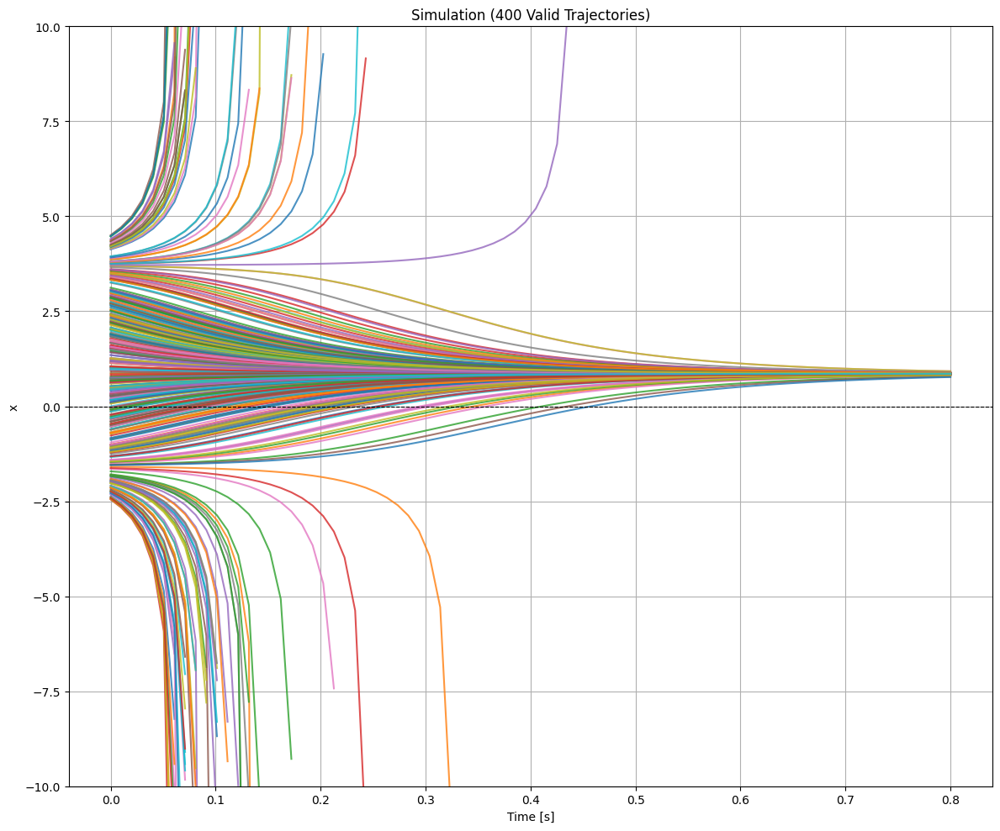

In [1]:
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy.integrate import solve_ivp
# from numpy.polynomial import Polynomial
# # f(x) = x^3 - 4x^2  - 11x + 30
# # System has 3 equilibria at [-3, 2, 5]. -3 and 5 are unstable, 2 is stable
# coeffs = [5, -4, -3, 1]
# poly = Polynomial(coeffs)
# def f(x):
#     return poly(x)
# def polyDyn1d(t, y):
#     return f(y)
# t_span = (0, 0.8)
# t_eval = np.linspace(*t_span, 80)
# x0_min, x0_max = -6.0, 6.0
# n_trajectories = 400
# solutions = []
# all_trajectories = []

# fig, (ax1) = plt.subplots(1, figsize=(12, 10))

# # --- Start of new/modified code ---

# # Define your data generation requirements
# n_trajectories_target = 400
# min_length = 7 # Minimum number of steps for a valid trajectory

# solutions = []
# all_trajectories = []
# rejected_count = 0

# # Use a while loop to ensure we collect enough valid trajectories
# while len(all_trajectories) < n_trajectories_target:
#     # Generate a random initial condition
#     x0 = np.random.uniform(x0_min, x0_max)
    
#     # Solve the ODE
#     solution = solve_ivp(polyDyn1d, t_span, [x0], t_eval=t_eval)

#     # Check if the generated sequence is long enough
#     if len(solution.y[0]) >= min_length:
#         # If it is, keep it and plot it
#         all_trajectories.append(solution.y[0])
#         solutions.append(solution)
#         ax1.plot(solution.t, solution.y[0], alpha=0.8)
#     else:
#         # If not, discard it and just increment a counter
#         rejected_count += 1
        
# print(f"Successfully generated {len(all_trajectories)} valid trajectories.")
# print(f"Rejected {rejected_count} short trajectories during generation.")

# # --- End of new/modified code ---

# # Plotting code remains the same
# ax1.axhline(0, color='k', linestyle='--', linewidth=0.8)
# # Update the title to reflect the actual number of plotted trajectories
# ax1.set_title(f"Simulation ({len(all_trajectories)} Valid Trajectories)")
# ax1.set_xlabel("Time [s]")
# ax1.set_ylabel("x")
# ax1.grid()
# ax1.set_ylim(-10, 10)
# plt.tight_layout()
# plt.show()

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from numpy.polynomial import Polynomial
# f(x) = x^3 - 4x^2  - 11x + 30
# System has 3 equilibria at [-3, 2, 5]. -3 and 5 are unstable, 2 is stable
coeffs = [5, -4, -3, 1]
poly = Polynomial(coeffs)
def f(x):
    return poly(x)
def polyDyn1d(t, y):
    return f(y)
t_span = (0, 0.8)
t_eval = np.linspace(*t_span, 80)
x0_min, x0_max = -6.0, 6.0
n_trajectories = 400
solutions = []
all_trajectories = []

fig, (ax1) = plt.subplots(1, figsize=(12, 10))

# --- Start of new/modified code ---

# Define your data generation requirements
n_trajectories_target = 400
min_length = 7 # Minimum number of steps for a valid trajectory

solutions = []
all_trajectories = []
rejected_count = 0

# Use a while loop to ensure we collect enough valid trajectories
while len(all_trajectories) < n_trajectories_target:
    # Generate a random initial condition
    x0 = np.random.uniform(x0_min, x0_max)
    
    # Solve the ODE
    solution = solve_ivp(polyDyn1d, t_span, [x0], t_eval=t_eval)

    # Check if the generated sequence is long enough
    if len(solution.y[0]) >= min_length:
        # If it is, keep it and plot it
        all_trajectories.append(solution.y[0])
        solutions.append(solution)
        ax1.plot(solution.t, solution.y[0], alpha=0.8)
        if(solution.y[0][len(solution.y[0])-1]) > 1:
            print(solution.y[0][len(solution.y[0])-1])
    else:
        # If not, discard it and just increment a counter
        rejected_count += 1
        
print(f"Successfully generated {len(all_trajectories)} valid trajectories.")
print(f"Rejected {rejected_count} short trajectories during generation.")

# --- End of new/modified code ---

# Plotting code remains the same
ax1.axhline(0, color='k', linestyle='--', linewidth=0.8)
# Update the title to reflect the actual number of plotted trajectories
ax1.set_title(f"Simulation ({len(all_trajectories)} Valid Trajectories)")
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("x")
ax1.grid()
ax1.set_ylim(-10, 10)
plt.tight_layout()
plt.show()

# No Embedding Matrix

In [2]:
import torch.nn as nn
import math
import torch 
from torch.nn import functional as F
import torch.optim as optim

block_size = 6
n_embd = 1
num_heads = 1
head_size = n_embd // num_heads
dropout_rate = 0.2

# Prep Data
inputs = []
for trajectory in all_trajectories:
    for i in range(len(trajectory) - block_size):
        inputs.append(trajectory[i:i + block_size + 1])
training_inputs = inputs[:int(len(inputs)*.75)]
test_inputs = inputs[int(len(inputs)*.75):]
# Train Model
w_key = nn.Linear(n_embd, head_size, bias=False)
w_query = nn.Linear(n_embd, head_size, bias=False)
w_value = nn.Linear(n_embd, head_size, bias=False)
w_attn_output = nn.Linear(head_size * num_heads, n_embd, bias=False)
dropout = nn.Dropout(dropout_rate)
norm_attn_gain = nn.Parameter(torch.ones(n_embd))
norm_attn_bias = nn.Parameter(torch.zeros(n_embd))
w_ffn = nn.Linear(n_embd, 40 * n_embd)
w_ffn_output = nn.Linear(40 * n_embd, n_embd)
norm_logits_gain = nn.Parameter(torch.ones(n_embd))
norm_logits_bias = nn.Parameter(torch.zeros(n_embd))
w_logits_output = nn.Linear(n_embd, 1)

params = [
    w_key.weight, w_query.weight, w_value.weight, w_attn_output.weight,
    norm_attn_gain, norm_attn_bias,
    w_ffn.weight, w_ffn.bias, w_ffn_output.weight, w_ffn_output.bias,
    norm_logits_gain, norm_logits_bias,
    w_logits_output.weight, w_logits_output.bias
]
optimizer = optim.Adam(params, lr=0.001)

# Training
n_epochs = 3
for epoch in range(n_epochs):
    epoch_loss = 0
    for input in training_inputs:
        input_sequence = torch.tensor(input, dtype=torch.float32)
        input_data = input_sequence[:block_size]
        input_data = input_data.unsqueeze(-1)  # Go from a single 10 element vector to a matrix of 10 vectors (each of size 1)
        target = input_sequence[-1]
        # Attention Heads
        K, Q, V = w_key(input_data), w_query(input_data), w_value(input_data)
        raw_attention_scores = (Q @ K.transpose(-2,-1)) * (1.0 / math.sqrt(head_size))
        masked_attention_scores = raw_attention_scores.masked_fill(torch.tril(torch.ones(block_size, block_size)) == 0, float('-inf'))
        attention_probabilities = dropout(F.softmax(masked_attention_scores, dim=-1))
        attention_output = dropout(w_attn_output(attention_probabilities @ V))
        # Add + Norm
        FFN_in_raw = attention_output + input_data
        FFN_in_normalized = norm_attn_gain * (FFN_in_raw - FFN_in_raw.mean(dim=-1, keepdim=True)) + norm_attn_bias
        # FFN
        FFN_activations = F.relu(w_ffn(FFN_in_normalized))
        FFN_output = dropout(w_ffn_output(FFN_activations))
        
        # Add + Norm
        logits_raw = FFN_output + FFN_in_normalized
        logits_normalized = norm_logits_gain * (logits_raw - logits_raw.mean(dim=-1, keepdim=True)) + norm_logits_bias
        # Linear
        logits = w_logits_output(logits_normalized)

        # Backpropagation
        prediction = logits[-1, 0]
        loss = F.mse_loss(prediction, target)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    print(f"Epoch {epoch}, Loss: {epoch_loss / len(training_inputs):.6f}")

total_params = 0
for i, p in enumerate(params):
    n = p.numel()
    total_params += n
    print(f"Param {i}: {n} parameters, shape: {p.shape}")
print(f"\nTotal parameters: {total_params}")

Epoch 0, Loss: 1.493319
Epoch 1, Loss: 1.494847
Epoch 2, Loss: 1.494787
Param 0: 1 parameters, shape: torch.Size([1, 1])
Param 1: 1 parameters, shape: torch.Size([1, 1])
Param 2: 1 parameters, shape: torch.Size([1, 1])
Param 3: 1 parameters, shape: torch.Size([1, 1])
Param 4: 1 parameters, shape: torch.Size([1])
Param 5: 1 parameters, shape: torch.Size([1])
Param 6: 40 parameters, shape: torch.Size([40, 1])
Param 7: 40 parameters, shape: torch.Size([40])
Param 8: 40 parameters, shape: torch.Size([1, 40])
Param 9: 1 parameters, shape: torch.Size([1])
Param 10: 1 parameters, shape: torch.Size([1])
Param 11: 1 parameters, shape: torch.Size([1])
Param 12: 1 parameters, shape: torch.Size([1, 1])
Param 13: 1 parameters, shape: torch.Size([1])

Total parameters: 131


In [3]:
# After training is complete, run inference
with torch.no_grad():
    for test_input in test_inputs:
        test_input_sequence = torch.tensor(test_input, dtype=torch.float32)
        test_input_data = test_input_sequence[:block_size]
        test_input_data = test_input_data.unsqueeze(-1)  # Go from a single 10 element vector to a matrix of 10 vectors (each of size 1)
        test_target = test_input_sequence[-1]

        K, Q, V = w_key(test_input_data), w_query(test_input_data), w_value(test_input_data)
        raw_attention_scores = (Q @ K.transpose(-2,-1)) * (1.0 / math.sqrt(head_size))
        masked_attention_scores = raw_attention_scores.masked_fill(torch.tril(torch.ones(block_size, block_size)) == 0, float('-inf'))
        attention_probabilities = dropout(F.softmax(masked_attention_scores, dim=-1))
        attention_output = dropout(w_attn_output(attention_probabilities @ V))
        # Add + Norm
        FFN_in_raw = attention_output + test_input_data
        FFN_in_normalized = norm_attn_gain * (FFN_in_raw - FFN_in_raw.mean(dim=-1, keepdim=True)) + norm_attn_bias
        # FFN
        FFN_activations = F.relu(w_ffn(FFN_in_normalized))
        FFN_output = dropout(w_ffn_output(FFN_activations))
        # Add + Norm
        logits_raw = FFN_output + FFN_in_normalized
        logits_normalized = norm_logits_gain * (logits_raw - logits_raw.mean(dim=-1, keepdim=True)) + norm_logits_bias
        # Linear
        logits = w_logits_output(logits_normalized)

        # Backpropagation
        prediction = logits[-1, 0]

        print(f"Prediction: {prediction.item()}")

Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Prediction: 0.8781797885894775
Predicti

5950


/var/folders/d_/pj_vvqcj1lj9fqtdrzb8hgjm0000gn/T/ipykernel_82794/1470616332.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_input_sequence = torch.tensor(test_input, dtype=torch.float32)


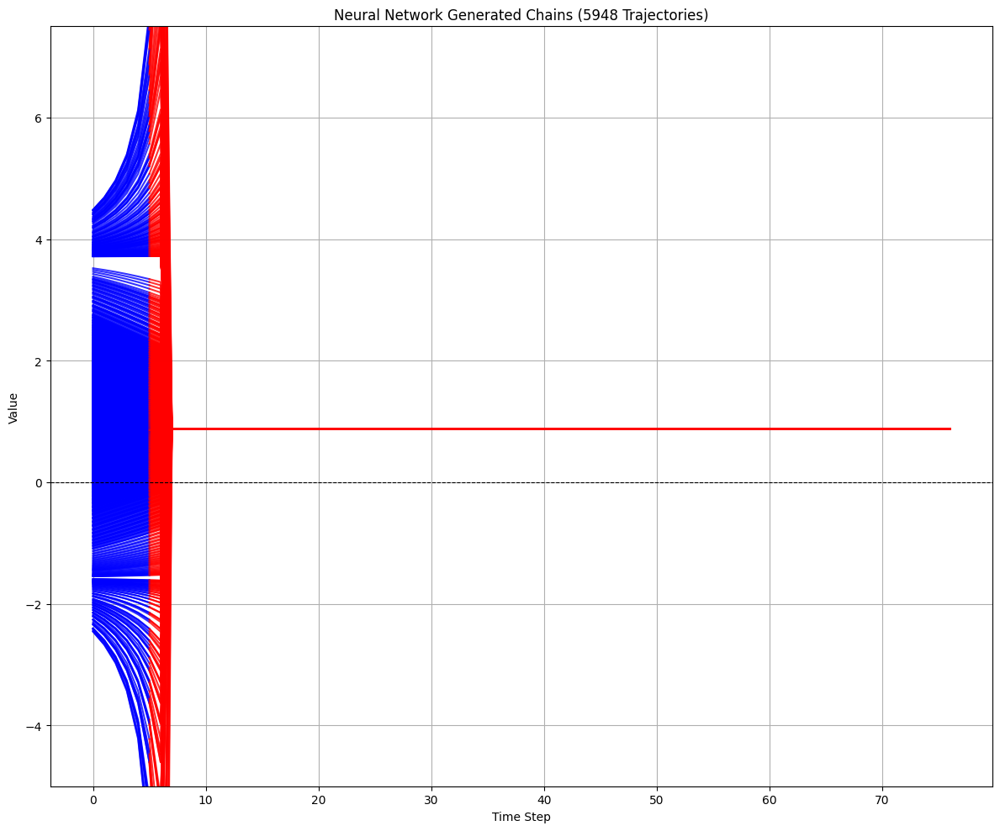

In [4]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import math
chains = []
with torch.no_grad():
    j = 0
    print(len(test_inputs))
    for idx, test_input in enumerate(test_inputs):
        if test_input[0] > -2.5 and test_input[0] < 4.5:
            chain = test_input.tolist()
            chains.append(chain)
            cancel = False
            i = 10
            prediction = 0
            while i < 80 and cancel == False:
                test_input_sequence = torch.tensor(test_input, dtype=torch.float32)
                test_input_data = test_input_sequence[:block_size]
                test_input_data = test_input_data.unsqueeze(-1)
                test_target = test_input_sequence[-1]
                
                test_embedded_input = test_input_data
                K, Q, V = w_key(test_embedded_input), w_query(test_embedded_input), w_value(test_embedded_input)
                raw_attention_scores = (Q @ K.transpose(-2,-1)) * (1.0 / math.sqrt(head_size))
                masked_attention_scores = raw_attention_scores.masked_fill(torch.tril(torch.ones(block_size, block_size)) == 0, float('-inf'))
                attention_probabilities = dropout(F.softmax(masked_attention_scores, dim=-1))
                attention_output = dropout(w_attn_output(attention_probabilities @ V))
                
                FFN_in_raw = attention_output + test_embedded_input
                FFN_in_normalized = norm_attn_gain * (FFN_in_raw - FFN_in_raw.mean(dim=-1, keepdim=True)) + norm_attn_bias
                
                FFN_activations = F.relu(w_ffn(FFN_in_normalized))
                FFN_output = dropout(w_ffn_output(FFN_activations))
                
                logits_raw = FFN_output + FFN_in_normalized
                logits_normalized = norm_logits_gain * (logits_raw - logits_raw.mean(dim=-1, keepdim=True)) + norm_logits_bias
                
                logits = w_logits_output(logits_normalized)
                prediction = logits[-1, 0].item()
                chain = chain[1:]
                chain.append(prediction)
                chains[j].append(prediction)
                test_input = torch.tensor(chain[-block_size:], dtype=torch.float32)
                i += 1
                if prediction < -5 or prediction > 7.5:
                    cancel = True
            j += 1

fig, ax1 = plt.subplots(1, figsize=(12, 10))
for chain in chains:
    t = np.arange(len(chain))
    ax1.plot(t[:block_size], chain[:block_size], color='blue', alpha=0.8)
    ax1.plot(t[block_size-1:], chain[block_size-1:], color='red', alpha=0.8)
ax1.axhline(0, color='k', linestyle='--', linewidth=0.8)
ax1.set_title(f"Neural Network Generated Chains ({len(chains)} Trajectories)")
ax1.set_xlabel("Time Step")
ax1.set_ylabel("Value")
ax1.grid()
ax1.set_ylim(-5, 7.5)
plt.tight_layout()
plt.show()

# Embedding Matrix

In [5]:
import torch.nn as nn
import math
import torch 
from torch.nn import functional as F
import torch.optim as optim

block_size = 10
n_embd = 10
num_heads = 1
head_size = n_embd // num_heads
dropout_rate = 0.2

# Prep Data
inputs = []
for trajectory in all_trajectories:
    for i in range(len(trajectory) - block_size):
        inputs.append(trajectory[i:i + block_size + 1])
training_inputs = inputs[:int(len(inputs)*.75)]
test_inputs = inputs[int(len(inputs)*.75):]


# Train Model
embed = nn.Linear(1, n_embd, bias=False)
w_key = nn.Linear(n_embd, head_size, bias=False)
w_query = nn.Linear(n_embd, head_size, bias=False)
w_value = nn.Linear(n_embd, head_size, bias=False)
w_attn_output = nn.Linear(head_size * num_heads, n_embd, bias=False)
dropout = nn.Dropout(dropout_rate)
norm_attn_gain = nn.Parameter(torch.ones(n_embd))
norm_attn_bias = nn.Parameter(torch.zeros(n_embd))
w_ffn = nn.Linear(n_embd, 4 * n_embd)
w_ffn_output = nn.Linear(4 * n_embd, n_embd)
norm_logits_gain = nn.Parameter(torch.ones(n_embd))
norm_logits_bias = nn.Parameter(torch.zeros(n_embd))
w_logits_output = nn.Linear(n_embd, 1)

params = [
    embed.weight, w_key.weight, w_query.weight, w_value.weight, w_attn_output.weight,
    norm_attn_gain, norm_attn_bias,
    w_ffn.weight, w_ffn.bias, w_ffn_output.weight, w_ffn_output.bias,
    norm_logits_gain, norm_logits_bias,
    w_logits_output.weight, w_logits_output.bias
]
optimizer = optim.Adam(params, lr=0.001)

# Training
n_epochs = 8
for epoch in range(n_epochs):
    epoch_loss = 0
    for input in training_inputs:
        input_sequence = torch.tensor(input, dtype=torch.float32)
        input_data = input_sequence[:block_size]
        input_data = input_data.unsqueeze(-1)  # Go from a single 10 element vector to a matrix of 10 vectors (each of size 1)
        target = input_sequence[-1]
        # Attention Heads
        embedded_input = embed(input_data)
        K, Q, V = w_key(embedded_input), w_query(embedded_input), w_value(embedded_input)
        raw_attention_scores = (Q @ K.transpose(-2,-1)) * (1.0 / math.sqrt(head_size))
        masked_attention_scores = raw_attention_scores.masked_fill(torch.tril(torch.ones(block_size, block_size)) == 0, float('-inf'))
        attention_probabilities = dropout(F.softmax(masked_attention_scores, dim=-1))
        attention_output = dropout(w_attn_output(attention_probabilities @ V))
        # Add + Norm
        FFN_in_raw = attention_output + embedded_input
        FFN_in_normalized = norm_attn_gain * (FFN_in_raw - FFN_in_raw.mean(dim=-1, keepdim=True)) + norm_attn_bias
        # FFN
        FFN_activations = F.relu(w_ffn(FFN_in_normalized))
        FFN_output = dropout(w_ffn_output(FFN_activations))
        # Add + Norm
        logits_raw = FFN_output + FFN_in_normalized
        logits_normalized = norm_logits_gain * (logits_raw - logits_raw.mean(dim=-1, keepdim=True)) + norm_logits_bias
        # Linear
        logits = w_logits_output(logits_normalized)

        # Backpropagation
        prediction = logits[-1, 0]
        loss = F.mse_loss(prediction, target)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    print(f"Epoch {epoch}, Loss: {epoch_loss / len(training_inputs):.6f}")
total_params = 0
for i, p in enumerate(params):
    n = p.numel()
    total_params += n
    print(f"Param {i}: {n} parameters, shape: {p.shape}")
print(f"\nTotal parameters: {total_params}")

Epoch 0, Loss: 0.333139
Epoch 1, Loss: 0.320898
Epoch 2, Loss: 0.320962
Epoch 3, Loss: 0.330299
Epoch 4, Loss: 0.317573
Epoch 5, Loss: 0.317231
Epoch 6, Loss: 0.313659
Epoch 7, Loss: 0.299431
Param 0: 10 parameters, shape: torch.Size([10, 1])
Param 1: 100 parameters, shape: torch.Size([10, 10])
Param 2: 100 parameters, shape: torch.Size([10, 10])
Param 3: 100 parameters, shape: torch.Size([10, 10])
Param 4: 100 parameters, shape: torch.Size([10, 10])
Param 5: 10 parameters, shape: torch.Size([10])
Param 6: 10 parameters, shape: torch.Size([10])
Param 7: 400 parameters, shape: torch.Size([40, 10])
Param 8: 40 parameters, shape: torch.Size([40])
Param 9: 400 parameters, shape: torch.Size([10, 40])
Param 10: 10 parameters, shape: torch.Size([10])
Param 11: 10 parameters, shape: torch.Size([10])
Param 12: 10 parameters, shape: torch.Size([10])
Param 13: 10 parameters, shape: torch.Size([1, 10])
Param 14: 1 parameters, shape: torch.Size([1])

Total parameters: 1311


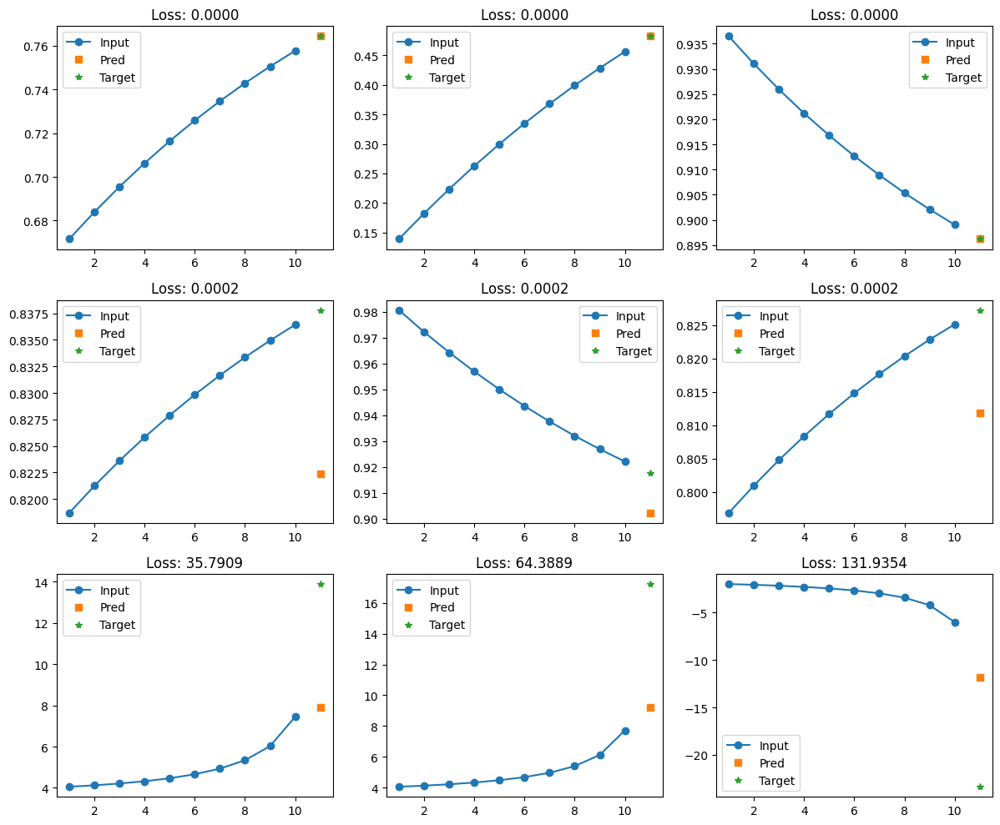

In [6]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import math

# Collect predictions and losses
predictions_data = []

with torch.no_grad():
    for idx, test_input in enumerate(test_inputs):
        test_input_sequence = torch.tensor(test_input, dtype=torch.float32)
        test_input_data = test_input_sequence[:block_size]
        test_input_data = test_input_data.unsqueeze(-1)
        test_target = test_input_sequence[-1]
        
        test_embedded_input = embed(test_input_data)
        K, Q, V = w_key(test_embedded_input), w_query(test_embedded_input), w_value(test_embedded_input)
        raw_attention_scores = (Q @ K.transpose(-2,-1)) * (1.0 / math.sqrt(head_size))
        masked_attention_scores = raw_attention_scores.masked_fill(torch.tril(torch.ones(block_size, block_size)) == 0, float('-inf'))
        attention_probabilities = dropout(F.softmax(masked_attention_scores, dim=-1))
        attention_output = dropout(w_attn_output(attention_probabilities @ V))
        
        FFN_in_raw = attention_output + test_embedded_input
        FFN_in_normalized = norm_attn_gain * (FFN_in_raw - FFN_in_raw.mean(dim=-1, keepdim=True)) + norm_attn_bias
        
        FFN_activations = F.relu(w_ffn(FFN_in_normalized))
        FFN_output = dropout(w_ffn_output(FFN_activations))
        
        logits_raw = FFN_output + FFN_in_normalized
        logits_normalized = norm_logits_gain * (logits_raw - logits_raw.mean(dim=-1, keepdim=True)) + norm_logits_bias
        
        logits = w_logits_output(logits_normalized)
        prediction = logits[-1, 0]
        
        loss = F.mse_loss(prediction, test_target)
        predictions_data.append((loss.item(), list(test_input[:block_size]), prediction.item(), test_target.item()))

# Sort by loss and select examples
predictions_data.sort(key=lambda x: x[0])
n = len(predictions_data) // 2
selected = predictions_data[:3] + predictions_data[n-1:n+2] + predictions_data[-3:]

# Plot
fig, axes = plt.subplots(3, 3, figsize=(12, 10))
for i, (loss, inputs, pred, target) in enumerate(selected):
    ax = axes[i // 3, i % 3]
    ax.plot(range(1, len(inputs) + 1), inputs, 'o-', label='Input')
    ax.plot(len(inputs) + 1, pred, 's', label='Pred')
    ax.plot(len(inputs) + 1, target, '*', label='Target')
    ax.set_title(f'Loss: {loss:.4f}')
    ax.legend()
plt.tight_layout()
plt.show()

5573


/var/folders/d_/pj_vvqcj1lj9fqtdrzb8hgjm0000gn/T/ipykernel_82794/3758318962.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_input_sequence = torch.tensor(test_input, dtype=torch.float32)


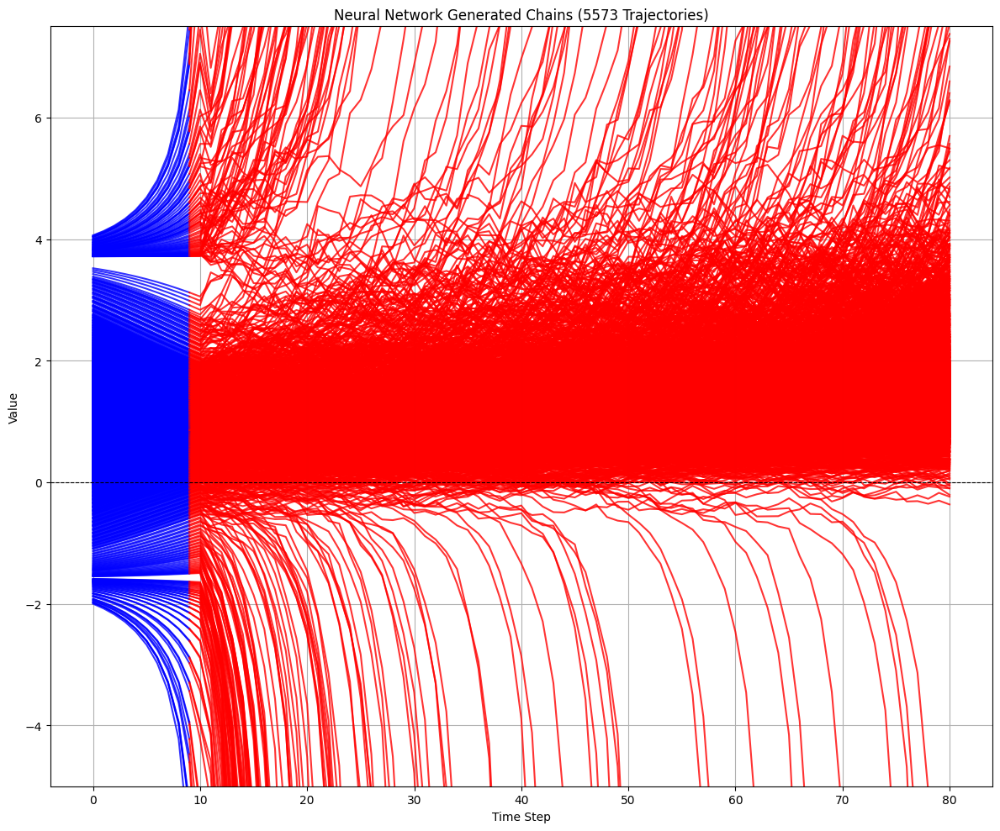

In [7]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import math
chains = []
with torch.no_grad():
    j = 0
    print(len(test_inputs))
    for idx, test_input in enumerate(test_inputs):
        if test_input[0] > -2.5 and test_input[0] < 4.5:
            chain = test_input.tolist()
            chains.append(chain)
            cancel = False
            i = 10
            prediction = 0
            while i < 80 and cancel == False:
                test_input_sequence = torch.tensor(test_input, dtype=torch.float32)
                test_input_data = test_input_sequence[:block_size]
                test_input_data = test_input_data.unsqueeze(-1)
                test_target = test_input_sequence[-1]
                
                test_embedded_input = embed(test_input_data)
                K, Q, V = w_key(test_embedded_input), w_query(test_embedded_input), w_value(test_embedded_input)
                raw_attention_scores = (Q @ K.transpose(-2,-1)) * (1.0 / math.sqrt(head_size))
                masked_attention_scores = raw_attention_scores.masked_fill(torch.tril(torch.ones(block_size, block_size)) == 0, float('-inf'))
                attention_probabilities = dropout(F.softmax(masked_attention_scores, dim=-1))
                attention_output = dropout(w_attn_output(attention_probabilities @ V))
                
                FFN_in_raw = attention_output + test_embedded_input
                FFN_in_normalized = norm_attn_gain * (FFN_in_raw - FFN_in_raw.mean(dim=-1, keepdim=True)) + norm_attn_bias
                
                FFN_activations = F.relu(w_ffn(FFN_in_normalized))
                FFN_output = dropout(w_ffn_output(FFN_activations))
                
                logits_raw = FFN_output + FFN_in_normalized
                logits_normalized = norm_logits_gain * (logits_raw - logits_raw.mean(dim=-1, keepdim=True)) + norm_logits_bias
                
                logits = w_logits_output(logits_normalized)
                prediction = logits[-1, 0].item()
                chain = chain[1:]
                chain.append(prediction)
                chains[j].append(prediction)
                test_input = torch.tensor(chain[-block_size:], dtype=torch.float32)
                i += 1
                if prediction < -5 or prediction > 7.5:
                    cancel = True
            j += 1

fig, ax1 = plt.subplots(1, figsize=(12, 10))
for chain in chains:
    t = np.arange(len(chain))
    ax1.plot(t[:block_size], chain[:block_size], color='blue', alpha=0.8)
    ax1.plot(t[block_size-1:], chain[block_size-1:], color='red', alpha=0.8)
ax1.axhline(0, color='k', linestyle='--', linewidth=0.8)
ax1.set_title(f"Neural Network Generated Chains ({len(chains)} Trajectories)")
ax1.set_xlabel("Time Step")
ax1.set_ylabel("Value")
ax1.grid()
ax1.set_ylim(-5, 7.5)
plt.tight_layout()
plt.show()

# Scaling

### 356 Params (n-embed = 5)

In [8]:
import torch.nn as nn
import math
import torch 
from torch.nn import functional as F
import torch.optim as optim

block_size = 10
n_embd = 5
num_heads = 1
head_size = n_embd // num_heads
dropout_rate = 0.2

# Prep Data
inputs = []
for trajectory in all_trajectories:
    for i in range(len(trajectory) - block_size):
        inputs.append(trajectory[i:i + block_size + 1])
training_inputs = inputs[:int(len(inputs)*.75)]
test_inputs = inputs[int(len(inputs)*.75):]


# Train Model
embed = nn.Linear(1, n_embd, bias=False)
w_key = nn.Linear(n_embd, head_size, bias=False)
w_query = nn.Linear(n_embd, head_size, bias=False)
w_value = nn.Linear(n_embd, head_size, bias=False)
w_attn_output = nn.Linear(head_size * num_heads, n_embd, bias=False)
dropout = nn.Dropout(dropout_rate)
norm_attn_gain = nn.Parameter(torch.ones(n_embd))
norm_attn_bias = nn.Parameter(torch.zeros(n_embd))
w_ffn = nn.Linear(n_embd, 4 * n_embd)
w_ffn_output = nn.Linear(4 * n_embd, n_embd)
norm_logits_gain = nn.Parameter(torch.ones(n_embd))
norm_logits_bias = nn.Parameter(torch.zeros(n_embd))
w_logits_output = nn.Linear(n_embd, 1)

params = [
    embed.weight, w_key.weight, w_query.weight, w_value.weight, w_attn_output.weight,
    norm_attn_gain, norm_attn_bias,
    w_ffn.weight, w_ffn.bias, w_ffn_output.weight, w_ffn_output.bias,
    norm_logits_gain, norm_logits_bias,
    w_logits_output.weight, w_logits_output.bias
]
optimizer = optim.Adam(params, lr=0.001)

# Training
n_epochs = 8
for epoch in range(n_epochs):
    epoch_loss = 0
    for input in training_inputs:
        input_sequence = torch.tensor(input, dtype=torch.float32)
        input_data = input_sequence[:block_size]
        input_data = input_data.unsqueeze(-1)  # Go from a single 10 element vector to a matrix of 10 vectors (each of size 1)
        target = input_sequence[-1]
        # Attention Heads
        embedded_input = embed(input_data)
        K, Q, V = w_key(embedded_input), w_query(embedded_input), w_value(embedded_input)
        raw_attention_scores = (Q @ K.transpose(-2,-1)) * (1.0 / math.sqrt(head_size))
        masked_attention_scores = raw_attention_scores.masked_fill(torch.tril(torch.ones(block_size, block_size)) == 0, float('-inf'))
        attention_probabilities = dropout(F.softmax(masked_attention_scores, dim=-1))
        attention_output = dropout(w_attn_output(attention_probabilities @ V))
        # Add + Norm
        FFN_in_raw = attention_output + embedded_input
        FFN_in_normalized = norm_attn_gain * (FFN_in_raw - FFN_in_raw.mean(dim=-1, keepdim=True)) + norm_attn_bias
        # FFN
        FFN_activations = F.relu(w_ffn(FFN_in_normalized))
        FFN_output = dropout(w_ffn_output(FFN_activations))
        # Add + Norm
        logits_raw = FFN_output + FFN_in_normalized
        logits_normalized = norm_logits_gain * (logits_raw - logits_raw.mean(dim=-1, keepdim=True)) + norm_logits_bias
        # Linear
        logits = w_logits_output(logits_normalized)

        # Backpropagation
        prediction = logits[-1, 0]
        loss = F.mse_loss(prediction, target)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    print(f"Epoch {epoch}, Loss: {epoch_loss / len(training_inputs):.6f}")
total_params = 0
for i, p in enumerate(params):
    n = p.numel()
    total_params += n
    print(f"Param {i}: {n} parameters, shape: {p.shape}")
print(f"\nTotal parameters: {total_params}")

Epoch 0, Loss: 0.332988
Epoch 1, Loss: 0.311798
Epoch 2, Loss: 0.306388
Epoch 3, Loss: 0.325959
Epoch 4, Loss: 0.304340
Epoch 5, Loss: 0.306921
Epoch 6, Loss: 0.309645
Epoch 7, Loss: 0.309321
Param 0: 5 parameters, shape: torch.Size([5, 1])
Param 1: 25 parameters, shape: torch.Size([5, 5])
Param 2: 25 parameters, shape: torch.Size([5, 5])
Param 3: 25 parameters, shape: torch.Size([5, 5])
Param 4: 25 parameters, shape: torch.Size([5, 5])
Param 5: 5 parameters, shape: torch.Size([5])
Param 6: 5 parameters, shape: torch.Size([5])
Param 7: 100 parameters, shape: torch.Size([20, 5])
Param 8: 20 parameters, shape: torch.Size([20])
Param 9: 100 parameters, shape: torch.Size([5, 20])
Param 10: 5 parameters, shape: torch.Size([5])
Param 11: 5 parameters, shape: torch.Size([5])
Param 12: 5 parameters, shape: torch.Size([5])
Param 13: 5 parameters, shape: torch.Size([1, 5])
Param 14: 1 parameters, shape: torch.Size([1])

Total parameters: 356


5573


/var/folders/d_/pj_vvqcj1lj9fqtdrzb8hgjm0000gn/T/ipykernel_82794/3758318962.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_input_sequence = torch.tensor(test_input, dtype=torch.float32)


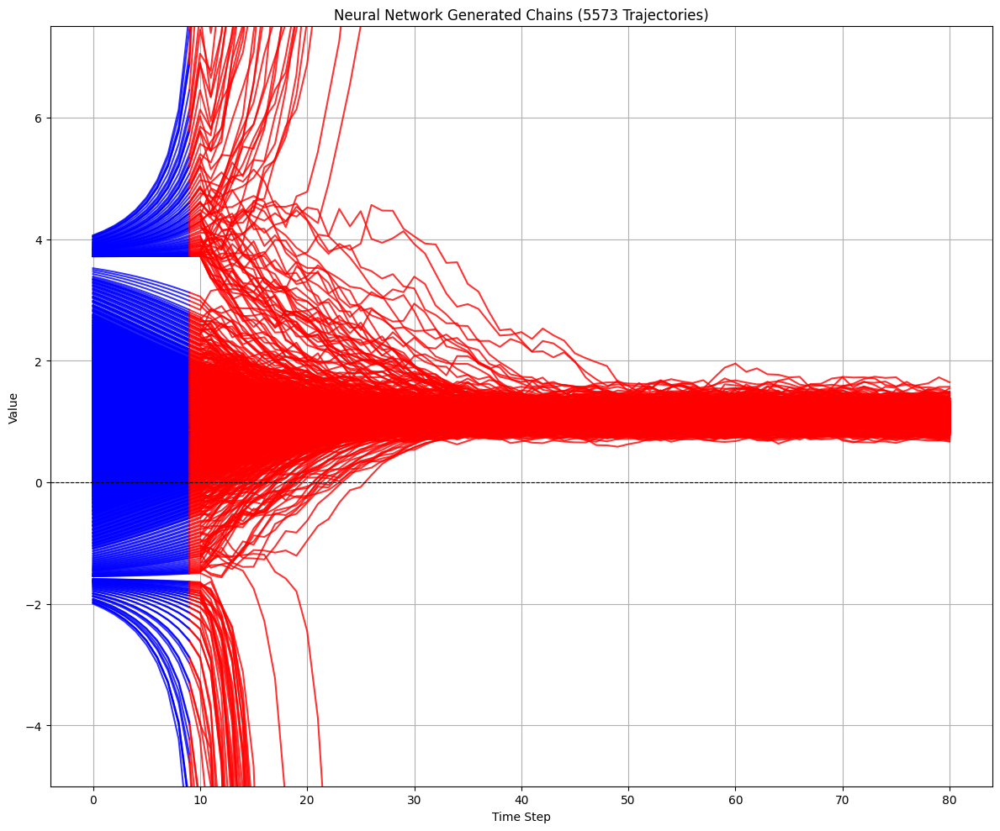

In [9]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import math
chains = []
with torch.no_grad():
    j = 0
    print(len(test_inputs))
    for idx, test_input in enumerate(test_inputs):
        if test_input[0] > -2.5 and test_input[0] < 4.5:
            chain = test_input.tolist()
            chains.append(chain)
            cancel = False
            i = 10
            prediction = 0
            while i < 80 and cancel == False:
                test_input_sequence = torch.tensor(test_input, dtype=torch.float32)
                test_input_data = test_input_sequence[:block_size]
                test_input_data = test_input_data.unsqueeze(-1)
                test_target = test_input_sequence[-1]
                
                test_embedded_input = embed(test_input_data)
                K, Q, V = w_key(test_embedded_input), w_query(test_embedded_input), w_value(test_embedded_input)
                raw_attention_scores = (Q @ K.transpose(-2,-1)) * (1.0 / math.sqrt(head_size))
                masked_attention_scores = raw_attention_scores.masked_fill(torch.tril(torch.ones(block_size, block_size)) == 0, float('-inf'))
                attention_probabilities = dropout(F.softmax(masked_attention_scores, dim=-1))
                attention_output = dropout(w_attn_output(attention_probabilities @ V))
                
                FFN_in_raw = attention_output + test_embedded_input
                FFN_in_normalized = norm_attn_gain * (FFN_in_raw - FFN_in_raw.mean(dim=-1, keepdim=True)) + norm_attn_bias
                
                FFN_activations = F.relu(w_ffn(FFN_in_normalized))
                FFN_output = dropout(w_ffn_output(FFN_activations))
                
                logits_raw = FFN_output + FFN_in_normalized
                logits_normalized = norm_logits_gain * (logits_raw - logits_raw.mean(dim=-1, keepdim=True)) + norm_logits_bias
                
                logits = w_logits_output(logits_normalized)
                prediction = logits[-1, 0].item()
                chain = chain[1:]
                chain.append(prediction)
                chains[j].append(prediction)
                test_input = torch.tensor(chain[-block_size:], dtype=torch.float32)
                i += 1
                if prediction < -5 or prediction > 7.5:
                    cancel = True
            j += 1

fig, ax1 = plt.subplots(1, figsize=(12, 10))
for chain in chains:
    t = np.arange(len(chain))
    ax1.plot(t[:block_size], chain[:block_size], color='blue', alpha=0.8)
    ax1.plot(t[block_size-1:], chain[block_size-1:], color='red', alpha=0.8)
ax1.axhline(0, color='k', linestyle='--', linewidth=0.8)
ax1.set_title(f"Neural Network Generated Chains ({len(chains)} Trajectories)")
ax1.set_xlabel("Time Step")
ax1.set_ylabel("Value")
ax1.grid()
ax1.set_ylim(-5, 7.5)
plt.tight_layout()
plt.show()

### 71 Params (n-embed = 2)

In [10]:
import torch.nn as nn
import math
import torch 
from torch.nn import functional as F
import torch.optim as optim

block_size = 10
n_embd = 2
num_heads = 1
head_size = n_embd // num_heads
dropout_rate = 0.2

# Prep Data
inputs = []
for trajectory in all_trajectories:
    for i in range(len(trajectory) - block_size):
        inputs.append(trajectory[i:i + block_size + 1])
training_inputs = inputs[:int(len(inputs)*.75)]
test_inputs = inputs[int(len(inputs)*.75):]


# Train Model
embed = nn.Linear(1, n_embd, bias=False)
w_key = nn.Linear(n_embd, head_size, bias=False)
w_query = nn.Linear(n_embd, head_size, bias=False)
w_value = nn.Linear(n_embd, head_size, bias=False)
w_attn_output = nn.Linear(head_size * num_heads, n_embd, bias=False)
dropout = nn.Dropout(dropout_rate)
norm_attn_gain = nn.Parameter(torch.ones(n_embd))
norm_attn_bias = nn.Parameter(torch.zeros(n_embd))
w_ffn = nn.Linear(n_embd, 4 * n_embd)
w_ffn_output = nn.Linear(4 * n_embd, n_embd)
norm_logits_gain = nn.Parameter(torch.ones(n_embd))
norm_logits_bias = nn.Parameter(torch.zeros(n_embd))
w_logits_output = nn.Linear(n_embd, 1)

params = [
    embed.weight, w_key.weight, w_query.weight, w_value.weight, w_attn_output.weight,
    norm_attn_gain, norm_attn_bias,
    w_ffn.weight, w_ffn.bias, w_ffn_output.weight, w_ffn_output.bias,
    norm_logits_gain, norm_logits_bias,
    w_logits_output.weight, w_logits_output.bias
]
optimizer = optim.Adam(params, lr=0.001)

# Training
n_epochs = 8
for epoch in range(n_epochs):
    epoch_loss = 0
    for input in training_inputs:
        input_sequence = torch.tensor(input, dtype=torch.float32)
        input_data = input_sequence[:block_size]
        input_data = input_data.unsqueeze(-1)  # Go from a single 10 element vector to a matrix of 10 vectors (each of size 1)
        target = input_sequence[-1]
        # Attention Heads
        embedded_input = embed(input_data)
        K, Q, V = w_key(embedded_input), w_query(embedded_input), w_value(embedded_input)
        raw_attention_scores = (Q @ K.transpose(-2,-1)) * (1.0 / math.sqrt(head_size))
        masked_attention_scores = raw_attention_scores.masked_fill(torch.tril(torch.ones(block_size, block_size)) == 0, float('-inf'))
        attention_probabilities = dropout(F.softmax(masked_attention_scores, dim=-1))
        attention_output = dropout(w_attn_output(attention_probabilities @ V))
        # Add + Norm
        FFN_in_raw = attention_output + embedded_input
        FFN_in_normalized = norm_attn_gain * (FFN_in_raw - FFN_in_raw.mean(dim=-1, keepdim=True)) + norm_attn_bias
        # FFN
        FFN_activations = F.relu(w_ffn(FFN_in_normalized))
        FFN_output = dropout(w_ffn_output(FFN_activations))
        # Add + Norm
        logits_raw = FFN_output + FFN_in_normalized
        logits_normalized = norm_logits_gain * (logits_raw - logits_raw.mean(dim=-1, keepdim=True)) + norm_logits_bias
        # Linear
        logits = w_logits_output(logits_normalized)

        # Backpropagation
        prediction = logits[-1, 0]
        loss = F.mse_loss(prediction, target)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    print(f"Epoch {epoch}, Loss: {epoch_loss / len(training_inputs):.6f}")
total_params = 0
for i, p in enumerate(params):
    n = p.numel()
    total_params += n
    print(f"Param {i}: {n} parameters, shape: {p.shape}")
print(f"\nTotal parameters: {total_params}")

Epoch 0, Loss: 0.506640
Epoch 1, Loss: 0.328175
Epoch 2, Loss: 0.321822
Epoch 3, Loss: 0.312187
Epoch 4, Loss: 0.312719
Epoch 5, Loss: 0.315747
Epoch 6, Loss: 0.292940
Epoch 7, Loss: 0.305234
Param 0: 2 parameters, shape: torch.Size([2, 1])
Param 1: 4 parameters, shape: torch.Size([2, 2])
Param 2: 4 parameters, shape: torch.Size([2, 2])
Param 3: 4 parameters, shape: torch.Size([2, 2])
Param 4: 4 parameters, shape: torch.Size([2, 2])
Param 5: 2 parameters, shape: torch.Size([2])
Param 6: 2 parameters, shape: torch.Size([2])
Param 7: 16 parameters, shape: torch.Size([8, 2])
Param 8: 8 parameters, shape: torch.Size([8])
Param 9: 16 parameters, shape: torch.Size([2, 8])
Param 10: 2 parameters, shape: torch.Size([2])
Param 11: 2 parameters, shape: torch.Size([2])
Param 12: 2 parameters, shape: torch.Size([2])
Param 13: 2 parameters, shape: torch.Size([1, 2])
Param 14: 1 parameters, shape: torch.Size([1])

Total parameters: 71


5573


/var/folders/d_/pj_vvqcj1lj9fqtdrzb8hgjm0000gn/T/ipykernel_82794/3758318962.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_input_sequence = torch.tensor(test_input, dtype=torch.float32)


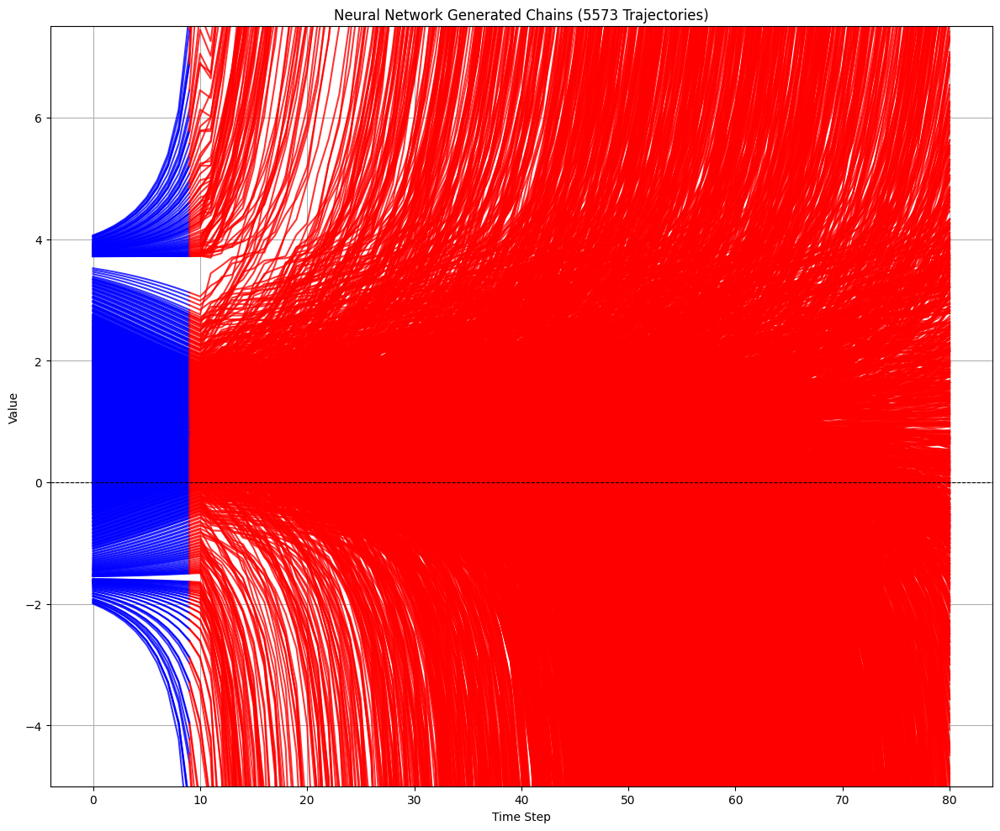

In [11]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import math
chains = []
with torch.no_grad():
    j = 0
    print(len(test_inputs))
    for idx, test_input in enumerate(test_inputs):
        if test_input[0] > -2.5 and test_input[0] < 4.5:
            chain = test_input.tolist()
            chains.append(chain)
            cancel = False
            i = 10
            prediction = 0
            while i < 80 and cancel == False:
                test_input_sequence = torch.tensor(test_input, dtype=torch.float32)
                test_input_data = test_input_sequence[:block_size]
                test_input_data = test_input_data.unsqueeze(-1)
                test_target = test_input_sequence[-1]
                
                test_embedded_input = embed(test_input_data)
                K, Q, V = w_key(test_embedded_input), w_query(test_embedded_input), w_value(test_embedded_input)
                raw_attention_scores = (Q @ K.transpose(-2,-1)) * (1.0 / math.sqrt(head_size))
                masked_attention_scores = raw_attention_scores.masked_fill(torch.tril(torch.ones(block_size, block_size)) == 0, float('-inf'))
                attention_probabilities = dropout(F.softmax(masked_attention_scores, dim=-1))
                attention_output = dropout(w_attn_output(attention_probabilities @ V))
                
                FFN_in_raw = attention_output + test_embedded_input
                FFN_in_normalized = norm_attn_gain * (FFN_in_raw - FFN_in_raw.mean(dim=-1, keepdim=True)) + norm_attn_bias
                
                FFN_activations = F.relu(w_ffn(FFN_in_normalized))
                FFN_output = dropout(w_ffn_output(FFN_activations))
                
                logits_raw = FFN_output + FFN_in_normalized
                logits_normalized = norm_logits_gain * (logits_raw - logits_raw.mean(dim=-1, keepdim=True)) + norm_logits_bias
                
                logits = w_logits_output(logits_normalized)
                prediction = logits[-1, 0].item()
                chain = chain[1:]
                chain.append(prediction)
                chains[j].append(prediction)
                test_input = torch.tensor(chain[-block_size:], dtype=torch.float32)
                i += 1
                if prediction < -5 or prediction > 7.5:
                    cancel = True
            j += 1

fig, ax1 = plt.subplots(1, figsize=(12, 10))
for chain in chains:
    t = np.arange(len(chain))
    ax1.plot(t[:block_size], chain[:block_size], color='blue', alpha=0.8)
    ax1.plot(t[block_size-1:], chain[block_size-1:], color='red', alpha=0.8)
ax1.axhline(0, color='k', linestyle='--', linewidth=0.8)
ax1.set_title(f"Neural Network Generated Chains ({len(chains)} Trajectories)")
ax1.set_xlabel("Time Step")
ax1.set_ylabel("Value")
ax1.grid()
ax1.set_ylim(-5, 7.5)
plt.tight_layout()
plt.show()

<img src="Screenshot 2025-10-08 at 1.07.59 PM.png">

# Extending Attention Heads and Layers

Successfully generated 400 valid trajectories.
Rejected 296 short trajectories during generation.


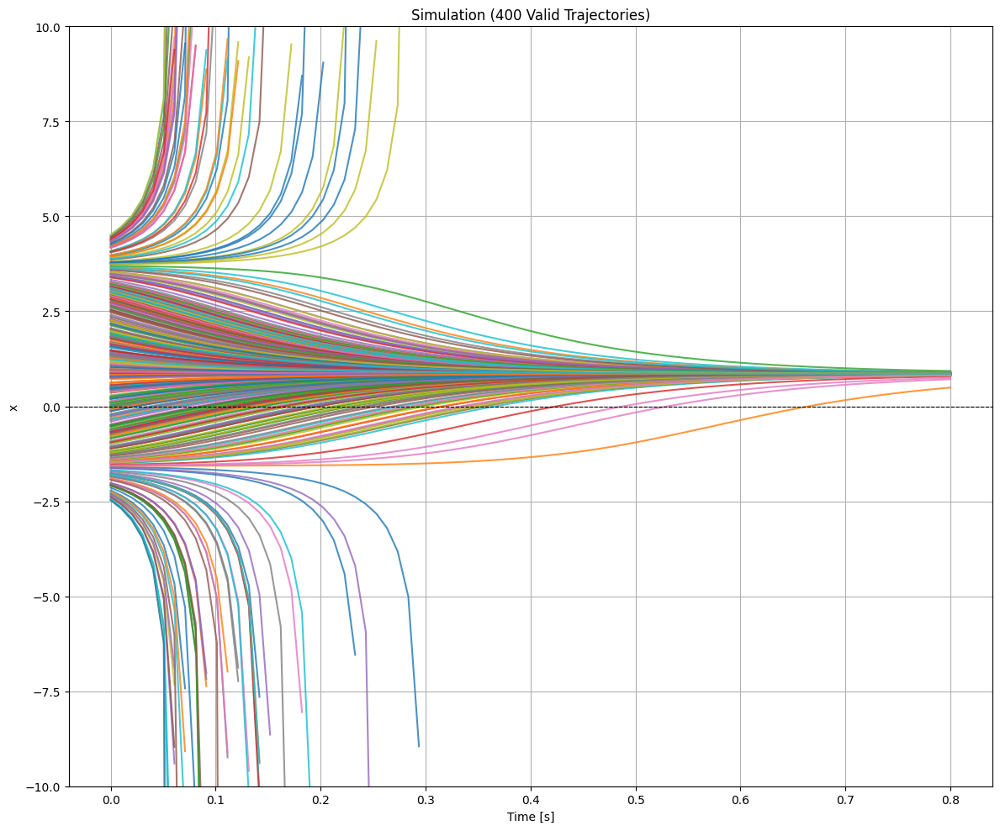

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from numpy.polynomial import Polynomial
# f(x) = x^3 - 4x^2  - 11x + 30
# System has 3 equilibria at [-3, 2, 5]. -3 and 5 are unstable, 2 is stable
coeffs = [5, -4, -3, 1]
poly = Polynomial(coeffs)
def f(x):
    return poly(x)
def polyDyn1d(t, y):
    return f(y)
t_span = (0, 0.8)
t_eval = np.linspace(*t_span, 80)
x0_min, x0_max = -6.0, 6.0

fig, (ax1) = plt.subplots(1, figsize=(12, 10))

# --- Start of new/modified code ---

# Define your data generation requirements
n_trajectories_target = 400
min_length = 7 # Minimum number of steps for a valid trajectory

solutions = []
all_trajectories = []
rejected_count = 0

# Use a while loop to ensure we collect enough valid trajectories
while len(all_trajectories) < n_trajectories_target:
    # Generate a random initial condition
    x0 = np.random.uniform(x0_min, x0_max)
    
    # Solve the ODE
    solution = solve_ivp(polyDyn1d, t_span, [x0], t_eval=t_eval)

    # Check if the generated sequence is long enough
    if len(solution.y[0]) >= min_length:
        # If it is, keep it and plot it
        all_trajectories.append(solution.y[0])
        solutions.append(solution)
        ax1.plot(solution.t, solution.y[0], alpha=0.8)
    else:
        # If not, discard it and just increment a counter
        rejected_count += 1
        
print(f"Successfully generated {len(all_trajectories)} valid trajectories.")
print(f"Rejected {rejected_count} short trajectories during generation.")

# --- End of new/modified code ---

# Plotting code remains the same
ax1.axhline(0, color='k', linestyle='--', linewidth=0.8)
# Update the title to reflect the actual number of plotted trajectories
ax1.set_title(f"Simulation ({len(all_trajectories)} Valid Trajectories)")
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("x")
ax1.grid()
ax1.set_ylim(-10, 10)
plt.tight_layout()
plt.show()

In [13]:
import torch.nn as nn
import math
import torch 
from torch.nn import functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

class AttentionHead(nn.Module):
    def __init__(self, n_embd, head_size, dropout_rate):
        super().__init__()
        self.head_size = head_size
        self.w_key = nn.Linear(n_embd, head_size, bias=False)
        self.w_query = nn.Linear(n_embd, head_size, bias=False)
        self.w_value = nn.Linear(n_embd, head_size, bias=False)
        self.dropout = nn.Dropout(dropout_rate)
    
    def forward(self, embedded_input, block_size):
        K = self.w_key(embedded_input)
        Q = self.w_query(embedded_input)
        V = self.w_value(embedded_input)
        raw_attention_scores = (Q @ K.transpose(-2,-1)) * (1.0 / math.sqrt(self.head_size))
        masked_attention_scores = raw_attention_scores.masked_fill(
            torch.tril(torch.ones(block_size, block_size)) == 0, float('-inf')
        )
        attention_probabilities = self.dropout(F.softmax(masked_attention_scores, dim=-1))
        return attention_probabilities @ V

class MultiHeadAttention(nn.Module):
    def __init__(self, n_embd, num_heads, head_size, dropout_rate):
        super().__init__()
        self.heads = nn.ModuleList([
            AttentionHead(n_embd, head_size, dropout_rate) for _ in range(num_heads)
        ])
        self.w_attn_output = nn.Linear(head_size * num_heads, n_embd, bias=False)
        self.dropout = nn.Dropout(dropout_rate)
    
    def forward(self, embedded_input, block_size):
        head_outputs = [head(embedded_input, block_size) for head in self.heads]
        concatenated = torch.cat(head_outputs, dim=-1)
        return self.dropout(self.w_attn_output(concatenated))
    
class FeedForward(nn.Module):
    def __init__(self, n_embd, dropout_rate):
        super().__init__()
        self.w_ffn = nn.Linear(n_embd, 4 * n_embd)
        self.w_ffn_output = nn.Linear(4 * n_embd, n_embd)
        self.dropout = nn.Dropout(dropout_rate)
    
    def forward(self, x):
        FFN_activations = F.relu(self.w_ffn(x))
        return self.dropout(self.w_ffn_output(FFN_activations))
    
class TransformerBlock(nn.Module):
    def __init__(self, n_embd, num_heads, head_size, dropout_rate):
        super().__init__()
        self.attention = MultiHeadAttention(n_embd, num_heads, head_size, dropout_rate)
        self.norm_attn_gain = nn.Parameter(torch.ones(n_embd))
        self.norm_attn_bias = nn.Parameter(torch.zeros(n_embd))
        self.ffn = FeedForward(n_embd, dropout_rate)
        self.norm_logits_gain = nn.Parameter(torch.ones(n_embd))
        self.norm_logits_bias = nn.Parameter(torch.zeros(n_embd))
    
    def forward(self, embedded_input, block_size):
        # Attention
        attention_output = self.attention(embedded_input, block_size)
        # Add + Norm
        FFN_in_raw = attention_output + embedded_input
        FFN_in_normalized = self.norm_attn_gain * (FFN_in_raw - FFN_in_raw.mean(dim=-1, keepdim=True)) + self.norm_attn_bias
        # FFN
        FFN_output = self.ffn(FFN_in_normalized)
        # Add + Norm
        logits_raw = FFN_output + FFN_in_normalized
        logits_normalized = self.norm_logits_gain * (logits_raw - logits_raw.mean(dim=-1, keepdim=True)) + self.norm_logits_bias
        return logits_normalized


class TransformerModel(nn.Module):
    def __init__(self, n_embd, num_heads, head_size, dropout_rate, num_layers=1):
        super().__init__()
        self.embed = nn.Linear(1, n_embd, bias=False)
        self.blocks = nn.ModuleList([
            TransformerBlock(n_embd, num_heads, head_size, dropout_rate) for _ in range(num_layers)
        ])
        self.w_logits_output = nn.Linear(n_embd, 1)
    
    def forward(self, input_data, block_size):
        embedded_input = self.embed(input_data)
        x = embedded_input
        for block in self.blocks:
            x = block(x, block_size)
        # Linear
        logits = self.w_logits_output(x)
        return logits


# Train Model
block_size = 10
n_embd = 10
num_heads = 1 # must be factor of 10 (block size)
head_size = n_embd // num_heads
dropout_rate = 0.2
num_layers = 1
model = TransformerModel(n_embd, num_heads, head_size, dropout_rate, num_layers)
optimizer = optim.Adam(model.parameters(), lr=0.001)
n_epochs = 8

# Prep Data
inputs = []
for trajectory in all_trajectories:
    for i in range(len(trajectory) - block_size):
        inputs.append(trajectory[i:i + block_size + 1])
training_inputs = inputs[:int(len(inputs)*.75)]
test_inputs = inputs[int(len(inputs)*.75):]
training_dataset = TensorDataset(torch.stack([torch.tensor(inp, dtype=torch.float32) for inp in training_inputs]))
train_loader = DataLoader(training_dataset, batch_size=32, shuffle=True)

for epoch in range(n_epochs):
    epoch_loss = 0
    for batch in train_loader:
        input_sequences = batch[0]  # Shape: (batch_size, block_size + 1)
        input_data = input_sequences[:, :block_size].unsqueeze(-1)  # Shape: (batch_size, block_size, 1)
        targets = input_sequences[:, -1]  # Shape: (batch_size,)
        
        
        logits = model(input_data, block_size)

        # Backpropagation
        predictions = logits[:, -1, 0]  # Shape: (batch_size,)
        loss = F.mse_loss(predictions, targets)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    print(f"Epoch {epoch}, Loss: {epoch_loss / len(training_inputs):.6f}")

total_params = sum(p.numel() for p in model.parameters())
for i, (name, p) in enumerate(model.named_parameters()):
    print(f"Param {i} ({name}): {p.numel()} parameters, shape: {p.shape}")
print(f"\nTotal parameters: {total_params}")

Epoch 0, Loss: 0.005860
Epoch 1, Loss: 0.002524
Epoch 2, Loss: 0.002158
Epoch 3, Loss: 0.002087
Epoch 4, Loss: 0.001968
Epoch 5, Loss: 0.001852
Epoch 6, Loss: 0.001471
Epoch 7, Loss: 0.001512
Param 0 (embed.weight): 10 parameters, shape: torch.Size([10, 1])
Param 1 (blocks.0.norm_attn_gain): 10 parameters, shape: torch.Size([10])
Param 2 (blocks.0.norm_attn_bias): 10 parameters, shape: torch.Size([10])
Param 3 (blocks.0.norm_logits_gain): 10 parameters, shape: torch.Size([10])
Param 4 (blocks.0.norm_logits_bias): 10 parameters, shape: torch.Size([10])
Param 5 (blocks.0.attention.heads.0.w_key.weight): 100 parameters, shape: torch.Size([10, 10])
Param 6 (blocks.0.attention.heads.0.w_query.weight): 100 parameters, shape: torch.Size([10, 10])
Param 7 (blocks.0.attention.heads.0.w_value.weight): 100 parameters, shape: torch.Size([10, 10])
Param 8 (blocks.0.attention.w_attn_output.weight): 100 parameters, shape: torch.Size([10, 10])
Param 9 (blocks.0.ffn.w_ffn.weight): 400 parameters, shape

!<img src="Screenshot 2025-10-08 at 1.12.52 PM.png">

# Large-Scale Run (With batching)

KeyboardInterrupt: 

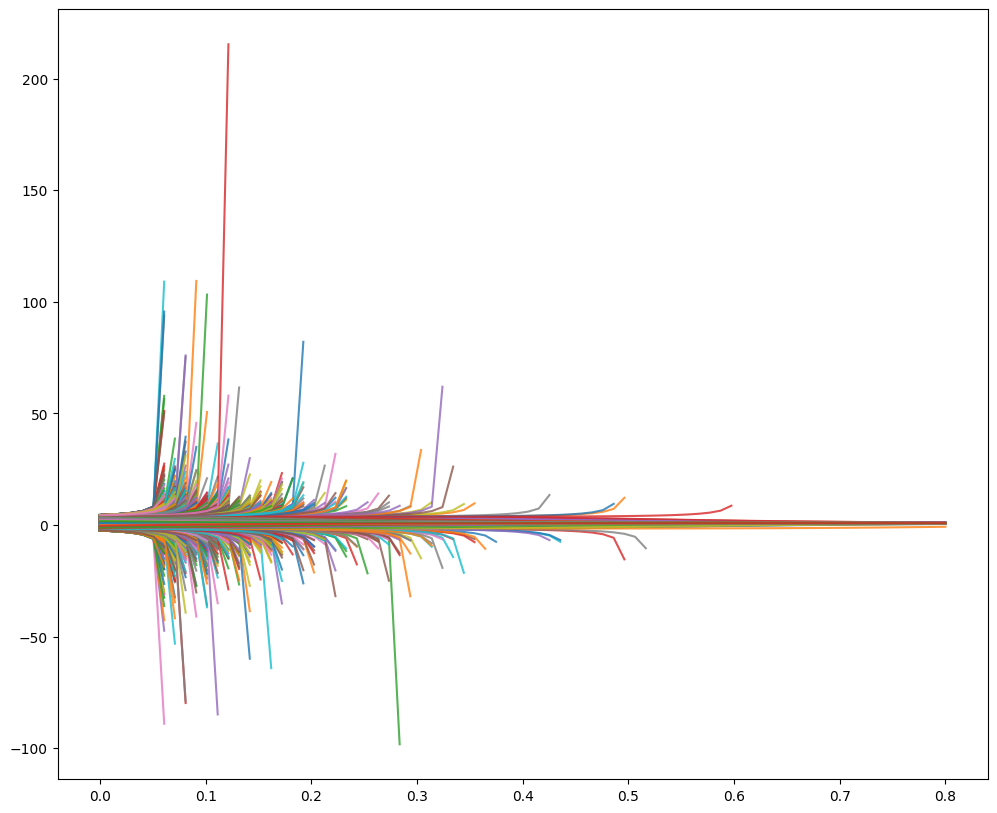

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from numpy.polynomial import Polynomial
# f(x) = x^3 - 4x^2  - 11x + 30
# System has 3 equilibria at [-3, 2, 5]. -3 and 5 are unstable, 2 is stable
coeffs = [5, -4, -3, 1]
poly = Polynomial(coeffs)
def f(x):
    return poly(x)
def polyDyn1d(t, y):
    return f(y)
t_span = (0, 0.8)
t_eval = np.linspace(*t_span, 80)
x0_min, x0_max = -6.0, 6.0
n_trajectories = 5000
solutions = []
all_trajectories = []

fig, (ax1) = plt.subplots(1, figsize=(12, 10))

# --- Start of new/modified code ---

# Define your data generation requirements
n_trajectories_target = 5000
min_length = 7 # Minimum number of steps for a valid trajectory

solutions = []
all_trajectories = []
rejected_count = 0

# Use a while loop to ensure we collect enough valid trajectories
while len(all_trajectories) < n_trajectories_target:
    # Generate a random initial condition
    x0 = np.random.uniform(x0_min, x0_max)
    
    # Solve the ODE
    solution = solve_ivp(polyDyn1d, t_span, [x0], t_eval=t_eval)

    # Check if the generated sequence is long enough
    if len(solution.y[0]) >= min_length:
        # If it is, keep it and plot it
        all_trajectories.append(solution.y[0])
        solutions.append(solution)
        ax1.plot(solution.t, solution.y[0], alpha=0.8)
    else:
        # If not, discard it and just increment a counter
        rejected_count += 1
        
print(f"Successfully generated {len(all_trajectories)} valid trajectories.")
print(f"Rejected {rejected_count} short trajectories during generation.")

# --- End of new/modified code ---

# Plotting code remains the same
ax1.axhline(0, color='k', linestyle='--', linewidth=0.8)
# Update the title to reflect the actual number of plotted trajectories
ax1.set_title(f"Simulation ({len(all_trajectories)} Valid Trajectories)")
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("x")
ax1.grid()
ax1.set_ylim(-10, 10)
plt.tight_layout()
plt.show()

In [ ]:
import torch.nn as nn
import math
import torch 
from torch.nn import functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

class AttentionHead(nn.Module):
    def __init__(self, n_embd, head_size, dropout_rate):
        super().__init__()
        self.head_size = head_size
        self.w_key = nn.Linear(n_embd, head_size, bias=False)
        self.w_query = nn.Linear(n_embd, head_size, bias=False)
        self.w_value = nn.Linear(n_embd, head_size, bias=False)
        self.dropout = nn.Dropout(dropout_rate)
    
    def forward(self, embedded_input, block_size):
        K = self.w_key(embedded_input)
        Q = self.w_query(embedded_input)
        V = self.w_value(embedded_input)
        raw_attention_scores = (Q @ K.transpose(-2,-1)) * (1.0 / math.sqrt(self.head_size))
        masked_attention_scores = raw_attention_scores.masked_fill(
            torch.tril(torch.ones(block_size, block_size)) == 0, float('-inf')
        )
        attention_probabilities = self.dropout(F.softmax(masked_attention_scores, dim=-1))
        return attention_probabilities @ V

class MultiHeadAttention(nn.Module):
    def __init__(self, n_embd, num_heads, head_size, dropout_rate):
        super().__init__()
        self.heads = nn.ModuleList([
            AttentionHead(n_embd, head_size, dropout_rate) for _ in range(num_heads)
        ])
        self.w_attn_output = nn.Linear(head_size * num_heads, n_embd, bias=False)
        self.dropout = nn.Dropout(dropout_rate)
    
    def forward(self, embedded_input, block_size):
        head_outputs = [head(embedded_input, block_size) for head in self.heads]
        concatenated = torch.cat(head_outputs, dim=-1)
        return self.dropout(self.w_attn_output(concatenated))
    
class FeedForward(nn.Module):
    def __init__(self, n_embd, dropout_rate):
        super().__init__()
        self.w_ffn = nn.Linear(n_embd, 4 * n_embd)
        self.w_ffn_output = nn.Linear(4 * n_embd, n_embd)
        self.dropout = nn.Dropout(dropout_rate)
    
    def forward(self, x):
        FFN_activations = F.relu(self.w_ffn(x))
        return self.dropout(self.w_ffn_output(FFN_activations))
    
class TransformerBlock(nn.Module):
    def __init__(self, n_embd, num_heads, head_size, dropout_rate):
        super().__init__()
        self.attention = MultiHeadAttention(n_embd, num_heads, head_size, dropout_rate)
        self.norm_attn_gain = nn.Parameter(torch.ones(n_embd))
        self.norm_attn_bias = nn.Parameter(torch.zeros(n_embd))
        self.ffn = FeedForward(n_embd, dropout_rate)
        self.norm_logits_gain = nn.Parameter(torch.ones(n_embd))
        self.norm_logits_bias = nn.Parameter(torch.zeros(n_embd))
    
    def forward(self, embedded_input, block_size):
        # Attention
        attention_output = self.attention(embedded_input, block_size)
        # Add + Norm
        FFN_in_raw = attention_output + embedded_input
        FFN_in_normalized = self.norm_attn_gain * (FFN_in_raw - FFN_in_raw.mean(dim=-1, keepdim=True)) + self.norm_attn_bias
        # FFN
        FFN_output = self.ffn(FFN_in_normalized)
        # Add + Norm
        logits_raw = FFN_output + FFN_in_normalized
        logits_normalized = self.norm_logits_gain * (logits_raw - logits_raw.mean(dim=-1, keepdim=True)) + self.norm_logits_bias
        return logits_normalized


class TransformerModel(nn.Module):
    def __init__(self, n_embd, num_heads, head_size, dropout_rate, num_layers=1):
        super().__init__()
        self.embed = nn.Linear(1, n_embd, bias=False)
        self.blocks = nn.ModuleList([
            TransformerBlock(n_embd, num_heads, head_size, dropout_rate) for _ in range(num_layers)
        ])
        self.w_logits_output = nn.Linear(n_embd, 1)
    
    def forward(self, input_data, block_size):
        embedded_input = self.embed(input_data)
        x = embedded_input
        for block in self.blocks:
            x = block(x, block_size)
        # Linear
        logits = self.w_logits_output(x)
        return logits


# Train Model
block_size = 10
n_embd = 10
num_heads = 1 # must be factor of 10 (block size)
head_size = n_embd // num_heads
dropout_rate = 0.2
num_layers = 1
model = TransformerModel(n_embd, num_heads, head_size, dropout_rate, num_layers)
optimizer = optim.Adam(model.parameters(), lr=0.001)
n_epochs = 8

# Prep Data
inputs = []
for trajectory in all_trajectories:
    for i in range(len(trajectory) - block_size):
        inputs.append(trajectory[i:i + block_size + 1])
training_inputs = inputs[:int(len(inputs)*.75)]
test_inputs = inputs[int(len(inputs)*.75):]
training_dataset = TensorDataset(torch.stack([torch.tensor(inp, dtype=torch.float32) for inp in training_inputs]))
train_loader = DataLoader(training_dataset, batch_size=32, shuffle=True)

for epoch in range(n_epochs):
    epoch_loss = 0
    for batch in train_loader:
        input_sequences = batch[0]  # Shape: (batch_size, block_size + 1)
        input_data = input_sequences[:, :block_size].unsqueeze(-1)  # Shape: (batch_size, block_size, 1)
        targets = input_sequences[:, -1]  # Shape: (batch_size,)
        
        
        logits = model(input_data, block_size)

        # Backpropagation
        predictions = logits[:, -1, 0]  # Shape: (batch_size,)
        loss = F.mse_loss(predictions, targets)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    print(f"Epoch {epoch}, Loss: {epoch_loss / len(training_inputs):.6f}")

total_params = sum(p.numel() for p in model.parameters())
for i, (name, p) in enumerate(model.named_parameters()):
    print(f"Param {i} ({name}): {p.numel()} parameters, shape: {p.shape}")
print(f"\nTotal parameters: {total_params}")

# Hyperparameter Tuning

Epoch 0, Loss: 0.130656
Epoch 1, Loss: 0.126328
Epoch 2, Loss: 0.122499
Epoch 3, Loss: 0.122810
Param 0 (embed.weight): 4 parameters, shape: torch.Size([4, 1])
Param 1 (blocks.0.norm_attn_gain): 4 parameters, shape: torch.Size([4])
Param 2 (blocks.0.norm_attn_bias): 4 parameters, shape: torch.Size([4])
Param 3 (blocks.0.norm_logits_gain): 4 parameters, shape: torch.Size([4])
Param 4 (blocks.0.norm_logits_bias): 4 parameters, shape: torch.Size([4])
Param 5 (blocks.0.attention.heads.0.w_key.weight): 16 parameters, shape: torch.Size([4, 4])
Param 6 (blocks.0.attention.heads.0.w_query.weight): 16 parameters, shape: torch.Size([4, 4])
Param 7 (blocks.0.attention.heads.0.w_value.weight): 16 parameters, shape: torch.Size([4, 4])
Param 8 (blocks.0.attention.w_attn_output.weight): 16 parameters, shape: torch.Size([4, 4])
Param 9 (blocks.0.ffn.w_ffn.weight): 64 parameters, shape: torch.Size([16, 4])
Param 10 (blocks.0.ffn.w_ffn.bias): 16 parameters, shape: torch.Size([16])
Param 11 (blocks.0.ffn

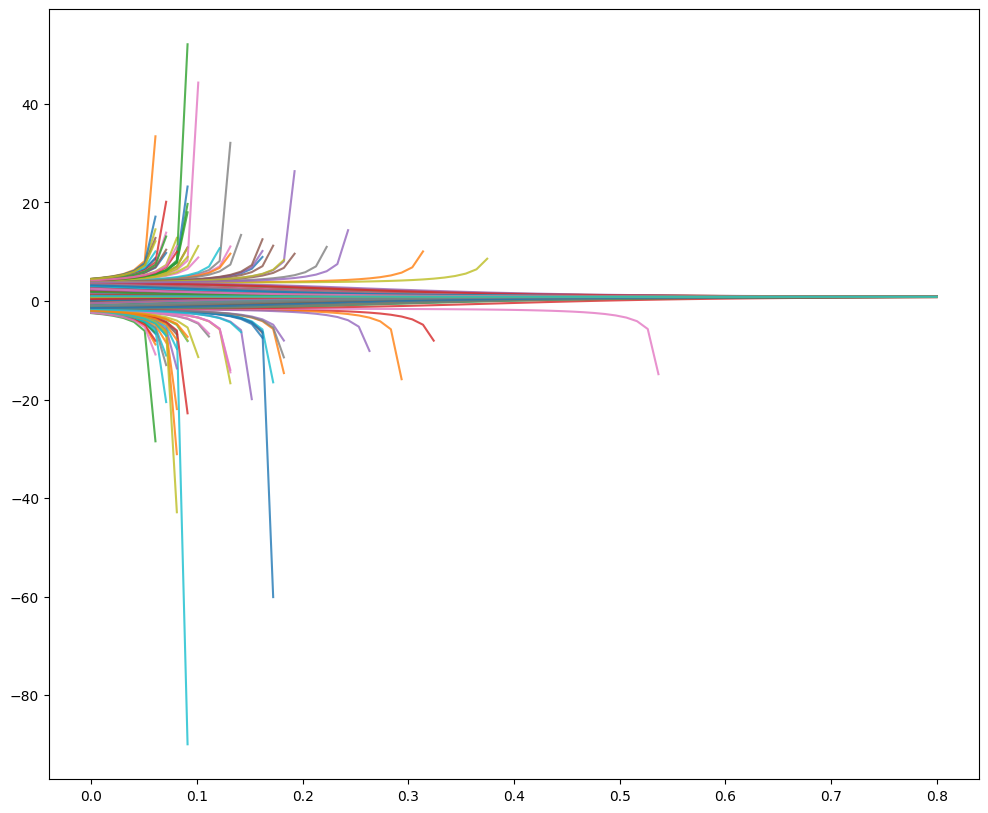

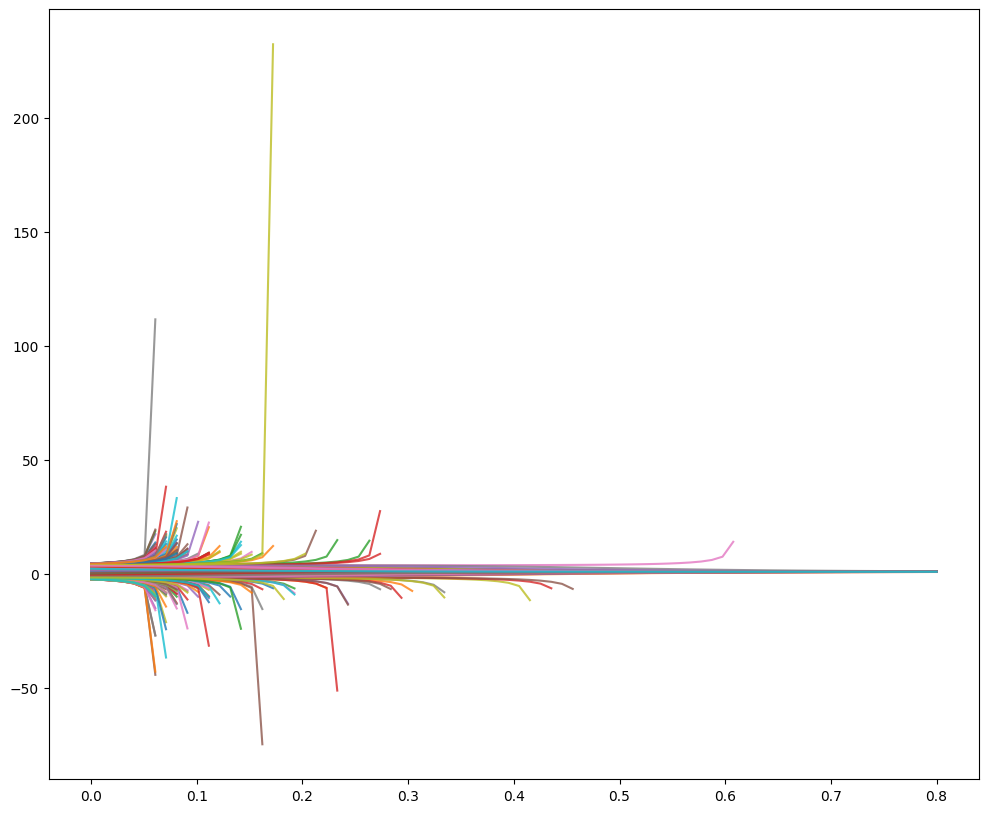

In [ ]:
block_size = 10
n_embds = [4, 8, 16]
num_heads_list = [1, 2, 4]
dropout_rate = 0.2
num_layers_list = [1, 3, 6]
n_epochs = 4
datas = [400, 800]
# Prep Data

models = []
for data in datas:
    coeffs = [5, -4, -3, 1]
    poly = Polynomial(coeffs)
    def f(x):
        return poly(x)
    def polyDyn1d(t, y):
        return f(y)
    t_span = (0, 0.8)
    t_eval = np.linspace(*t_span, 80)
    x0_min, x0_max = -6.0, 6.0

    fig, (ax1) = plt.subplots(1, figsize=(12, 10))
    n_trajectories_target = data
    min_length = 7 # Minimum number of steps for a valid trajectory

    solutions = []
    all_trajectories = []
    rejected_count = 0

    # Use a while loop to ensure we collect enough valid trajectories
    while len(all_trajectories) < n_trajectories_target:
        # Generate a random initial condition
        x0 = np.random.uniform(x0_min, x0_max)
        
        # Solve the ODE
        solution = solve_ivp(polyDyn1d, t_span, [x0], t_eval=t_eval)

        # Check if the generated sequence is long enough
        if len(solution.y[0]) >= min_length:
            # If it is, keep it and plot it
            all_trajectories.append(solution.y[0])
            solutions.append(solution)
            ax1.plot(solution.t, solution.y[0], alpha=0.8)
        else:
            # If not, discard it and just increment a counter
            rejected_count += 1

    inputs = []
    for trajectory in all_trajectories:
        for i in range(len(trajectory) - block_size):
            inputs.append(trajectory[i:i + block_size + 1])
    training_inputs = inputs[:int(len(inputs)*.75)]
    test_inputs = inputs[int(len(inputs)*.75):]
    for n_embd in n_embds:
        for num_heads in num_heads_list:
            for num_layers in num_layers_list:
                head_size = n_embd // num_heads
                model = TransformerModel(n_embd, num_heads, head_size, dropout_rate, num_layers)
                optimizer = optim.Adam(model.parameters(), lr=0.001)
                for epoch in range(n_epochs):
                    epoch_loss = 0
                    for batch in train_loader:
                        input_sequences = batch[0]  # Shape: (batch_size, block_size + 1)
                        input_data = input_sequences[:, :block_size].unsqueeze(-1)  # Shape: (batch_size, block_size, 1)
                        targets = input_sequences[:, -1]  # Shape: (batch_size,)
                        
                        
                        logits = model(input_data, block_size)

                        # Backpropagation
                        predictions = logits[:, -1, 0]  # Shape: (batch_size,)
                        loss = F.mse_loss(predictions, targets)
                        optimizer.zero_grad()
                        loss.backward()
                        optimizer.step()
                        epoch_loss += loss.item()
                    print(f"Epoch {epoch}, Loss: {epoch_loss / len(training_inputs):.6f}")

                total_params = sum(p.numel() for p in model.parameters())
                for i, (name, p) in enumerate(model.named_parameters()):
                    print(f"Param {i} ({name}): {p.numel()} parameters, shape: {p.shape}")
                print(f"\nTotal parameters: {total_params}", )
                print(f"Data Size: {data}, n_embd: {n_embd}, num_heads: {num_heads}, num_layers: {num_layers}")
                print("-"*50)
                models.append(model)

9.711745481448345
8.60372295789116
10.486529802479657
9.607581200137474
9.961918698744862
9.837940072874236
25.900569410006927
33.305696328885176
10.201508430290122
17.167390534539447
11.027549151745434
Successfully generated 75 valid trajectories.
Rejected 58 short trajectories during generation.


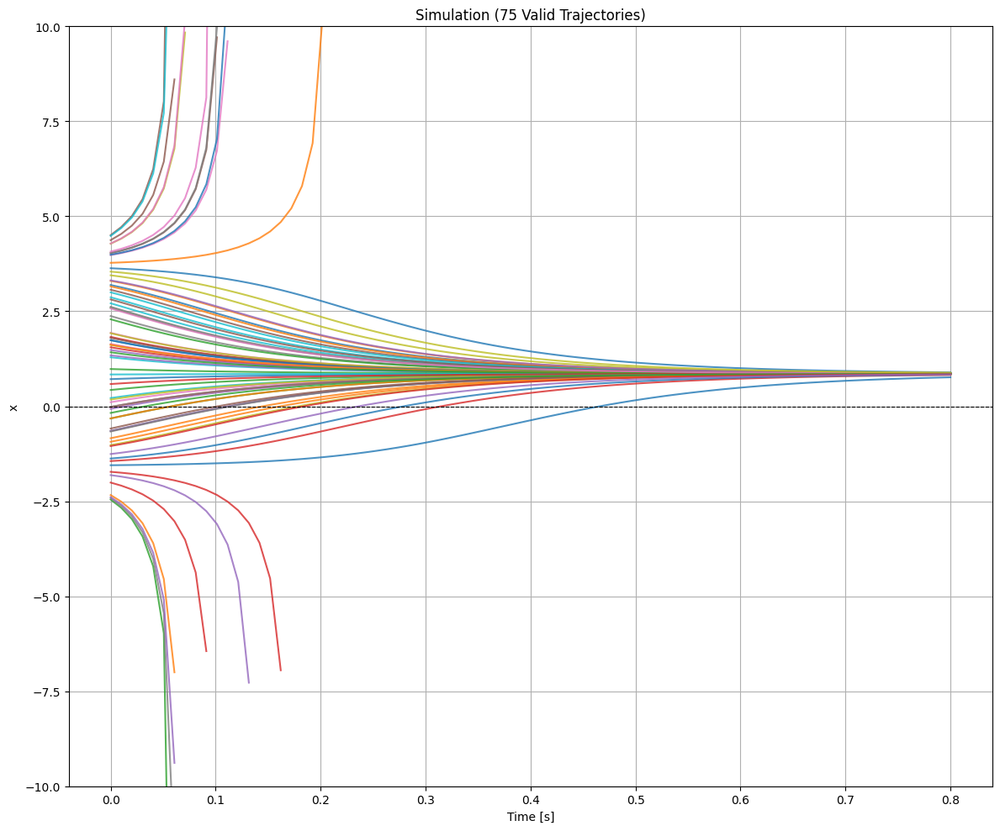

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from numpy.polynomial import Polynomial
# f(x) = x^3 - 4x^2  - 11x + 30
# System has 3 equilibria at [-3, 2, 5]. -3 and 5 are unstable, 2 is stable
coeffs = [5, -4, -3, 1]
poly = Polynomial(coeffs)
def f(x):
    return poly(x)
def polyDyn1d(t, y):
    return f(y)
t_span = (0, 0.8)
t_eval = np.linspace(*t_span, 80)
x0_min, x0_max = -6.0, 6.0
n_trajectories = 400
solutions = []
all_trajectories = []

fig, (ax1) = plt.subplots(1, figsize=(12, 10))

# --- Start of new/modified code ---

# Define your data generation requirements
n_trajectories_target = 75
min_length = 7 # Minimum number of steps for a valid trajectory

solutions = []
all_trajectories = []
rejected_count = 0

# Use a while loop to ensure we collect enough valid trajectories
while len(all_trajectories) < n_trajectories_target:
    # Generate a random initial condition
    x0 = np.random.uniform(x0_min, x0_max)
    
    # Solve the ODE
    solution = solve_ivp(polyDyn1d, t_span, [x0], t_eval=t_eval)

    # Check if the generated sequence is long enough
    if len(solution.y[0]) >= min_length:
        # If it is, keep it and plot it
        all_trajectories.append(solution.y[0])
        solutions.append(solution)
        ax1.plot(solution.t, solution.y[0], alpha=0.8)
        if(solution.y[0][len(solution.y[0])-1]) > 1:
            print(solution.y[0][len(solution.y[0])-1])
    else:
        # If not, discard it and just increment a counter
        rejected_count += 1
        
print(f"Successfully generated {len(all_trajectories)} valid trajectories.")
print(f"Rejected {rejected_count} short trajectories during generation.")

# --- End of new/modified code ---

# Plotting code remains the same
ax1.axhline(0, color='k', linestyle='--', linewidth=0.8)
# Update the title to reflect the actual number of plotted trajectories
ax1.set_title(f"Simulation ({len(all_trajectories)} Valid Trajectories)")
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("x")
ax1.grid()
ax1.set_ylim(-10, 10)
plt.tight_layout()
plt.show()


# Shuffle the collected trajectories after generation
indices = np.random.permutation(len(all_trajectories))
all_trajectories = [all_trajectories[i] for i in indices]
solutions = [solutions[i] for i in indices]

1005


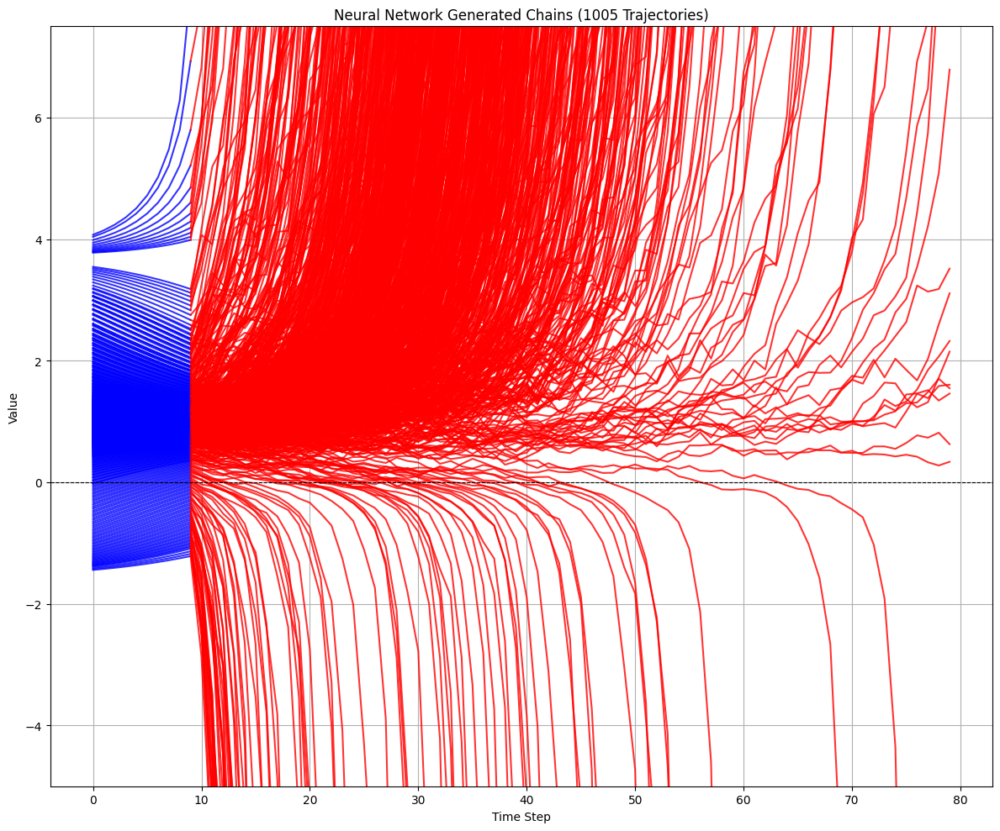

1005


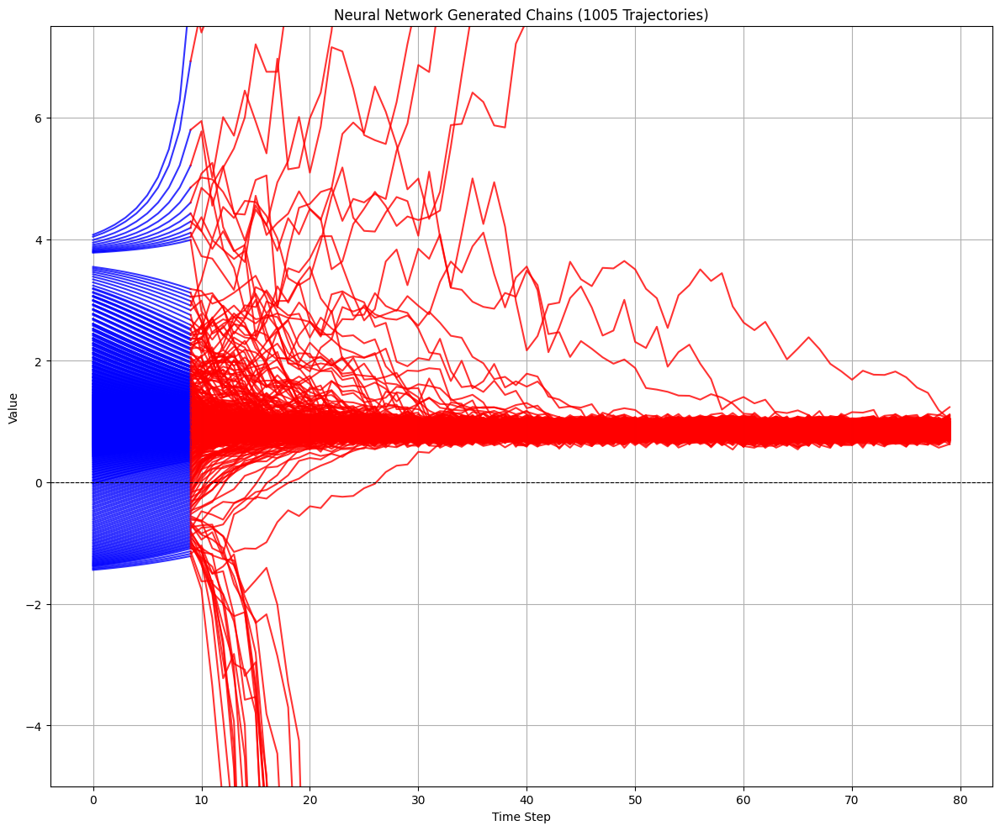

1005


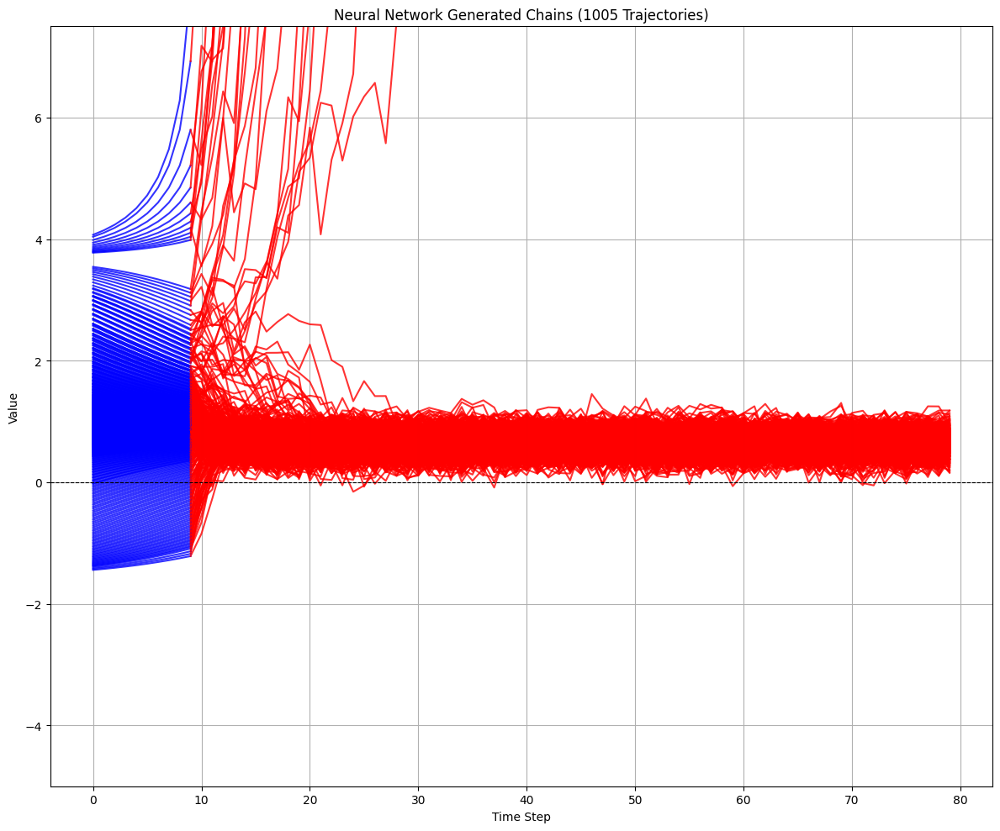

1005


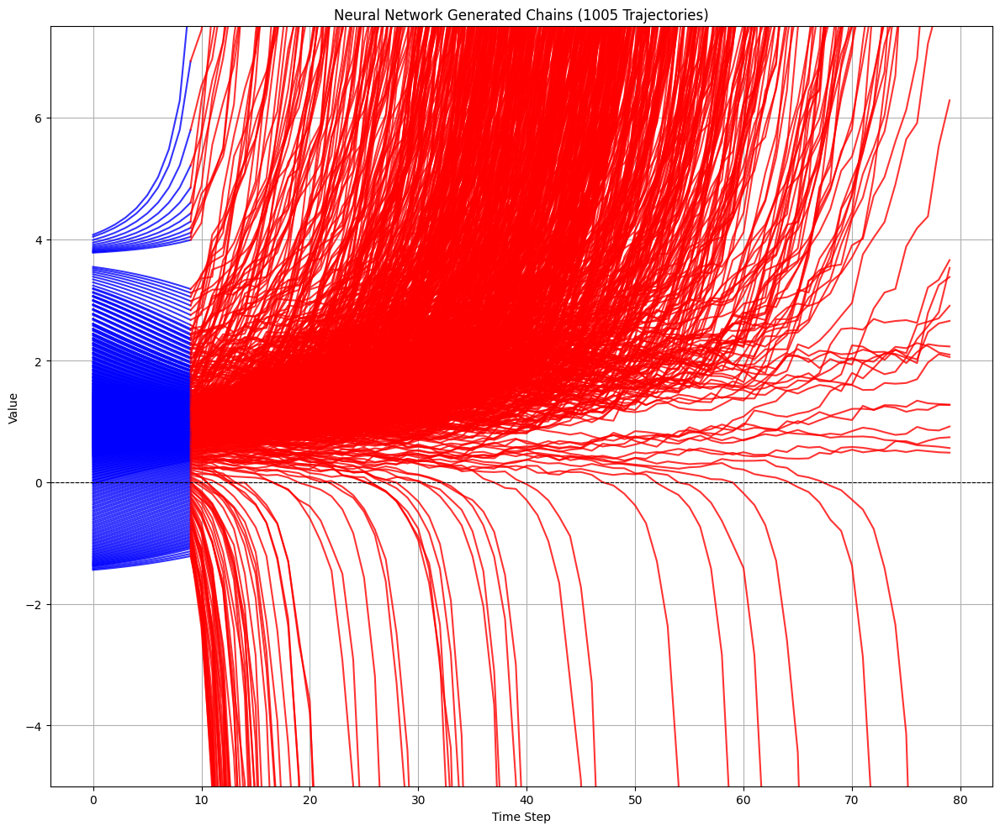

1005


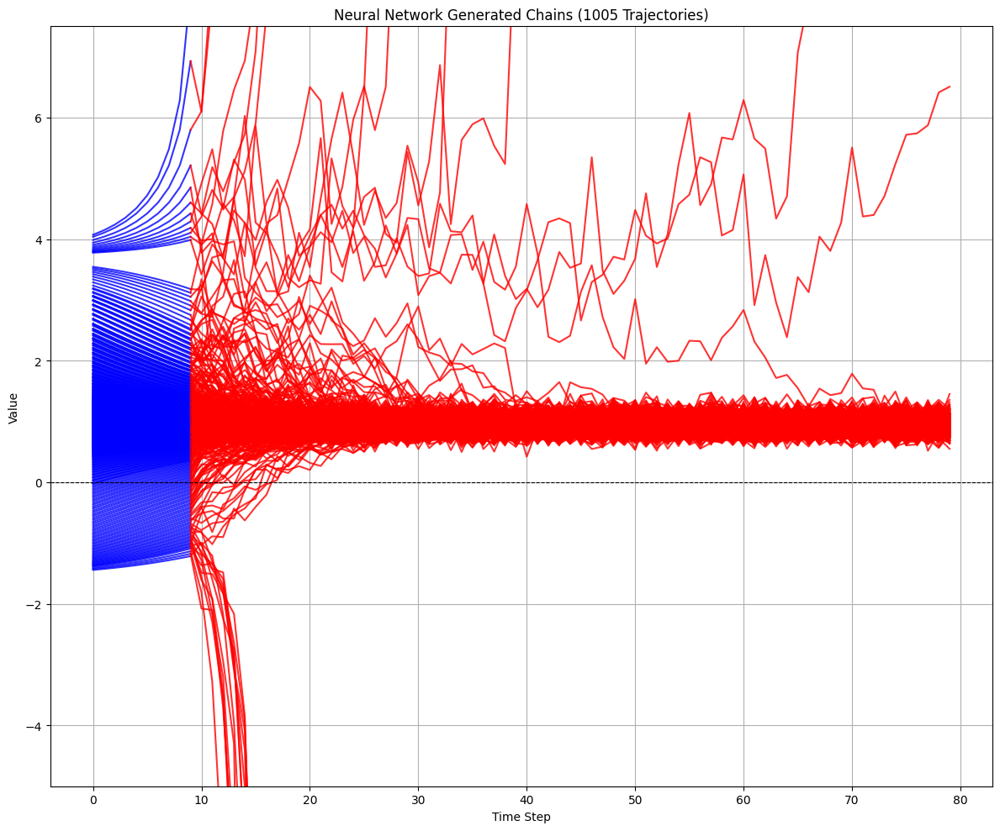

1005


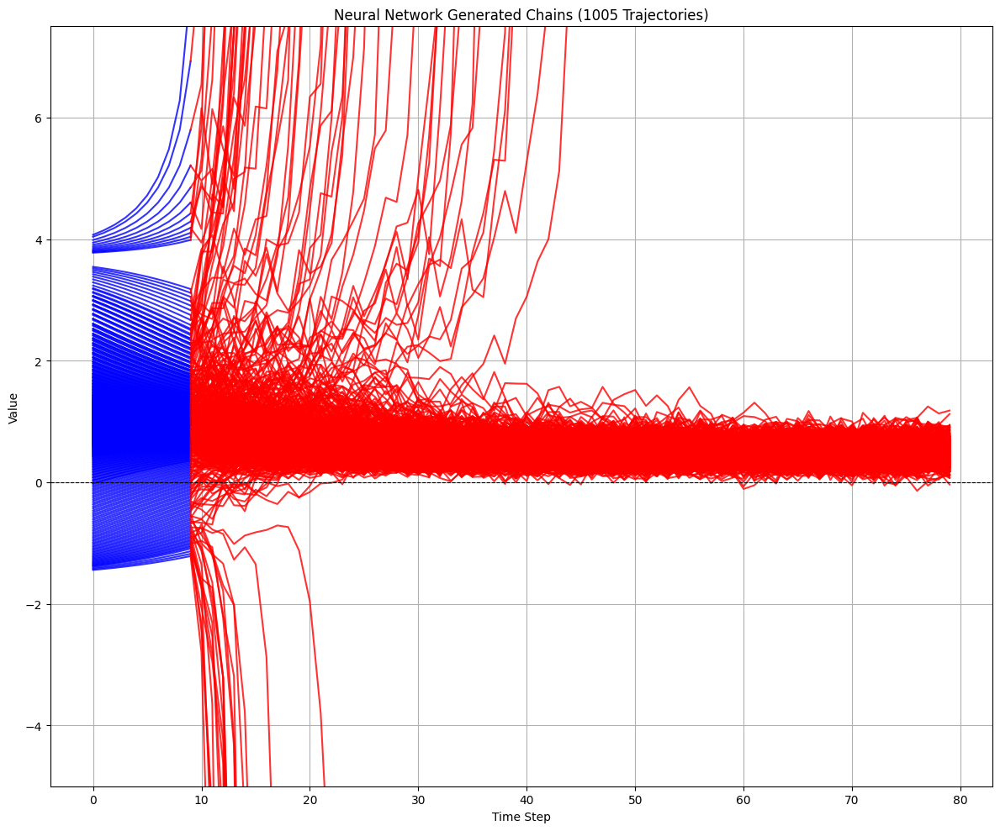

1005


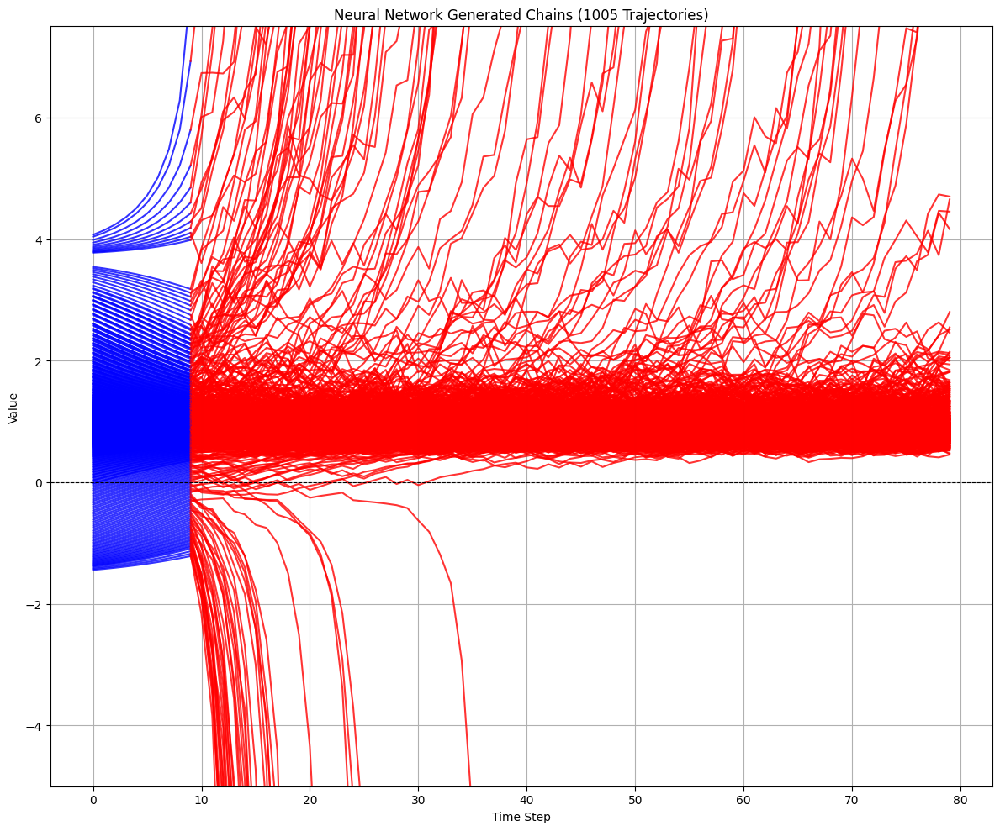

1005


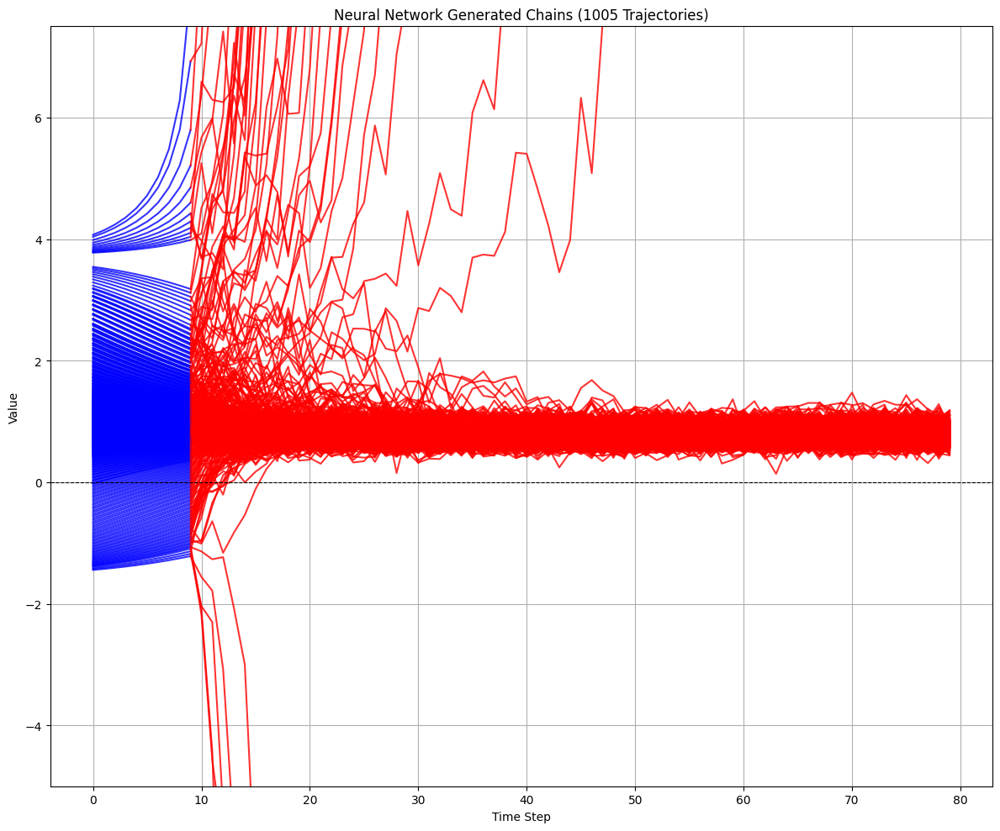

1005


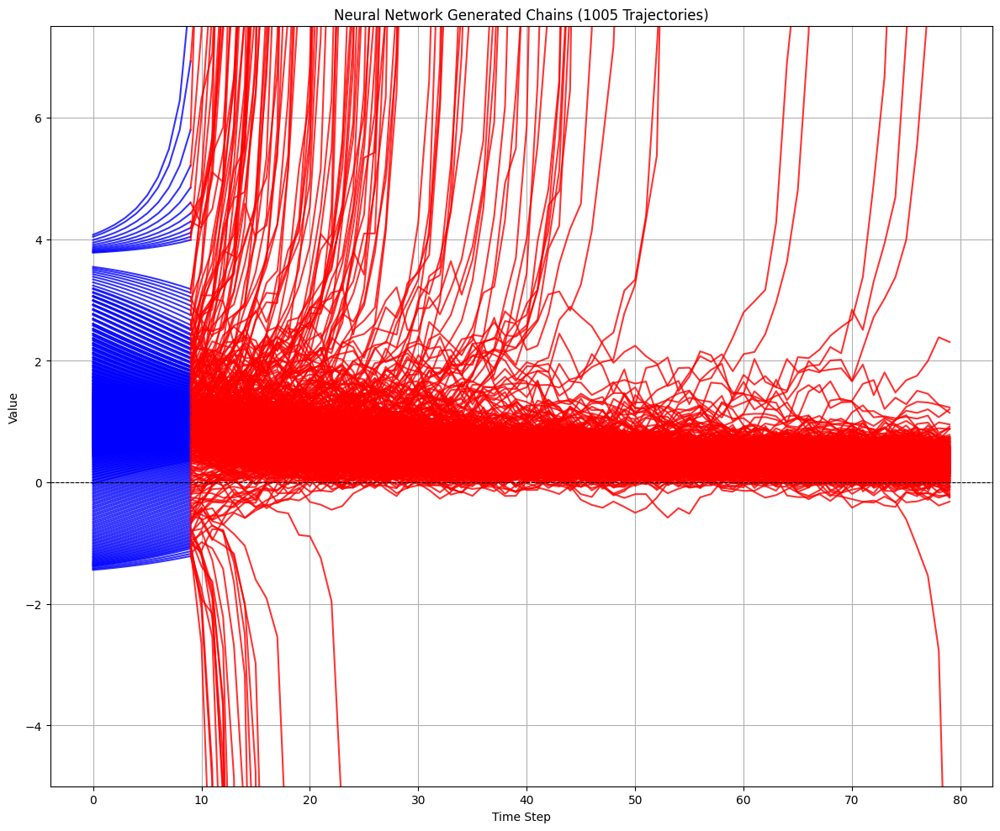

1005


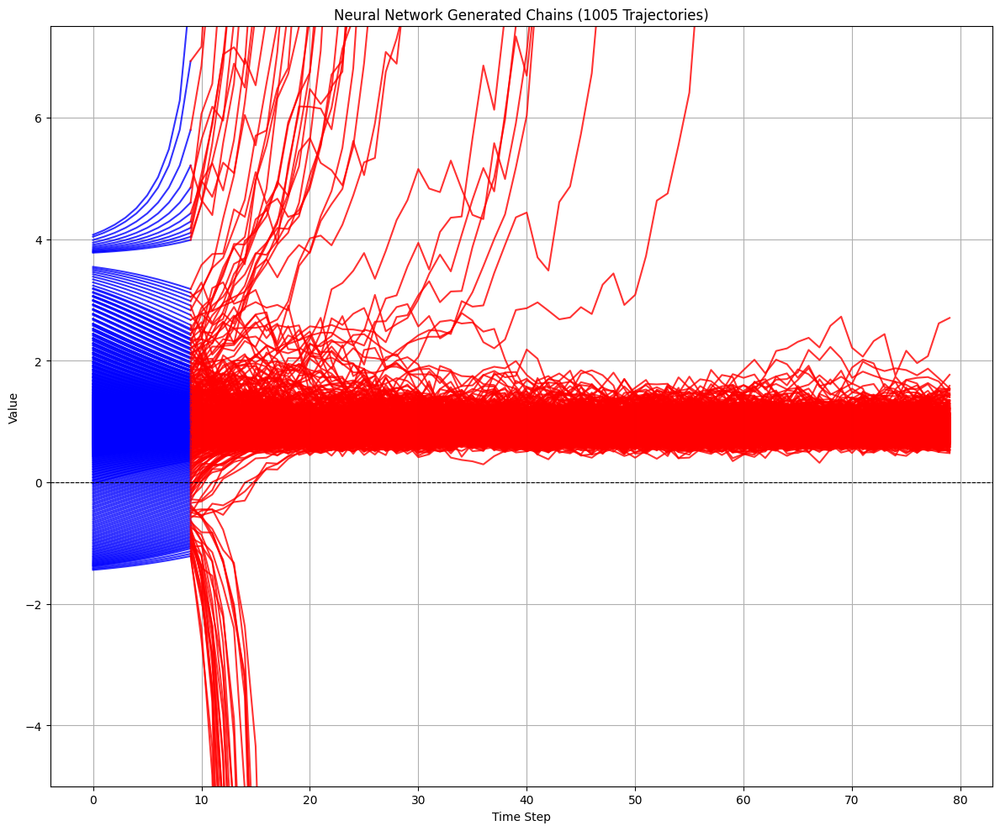

1005


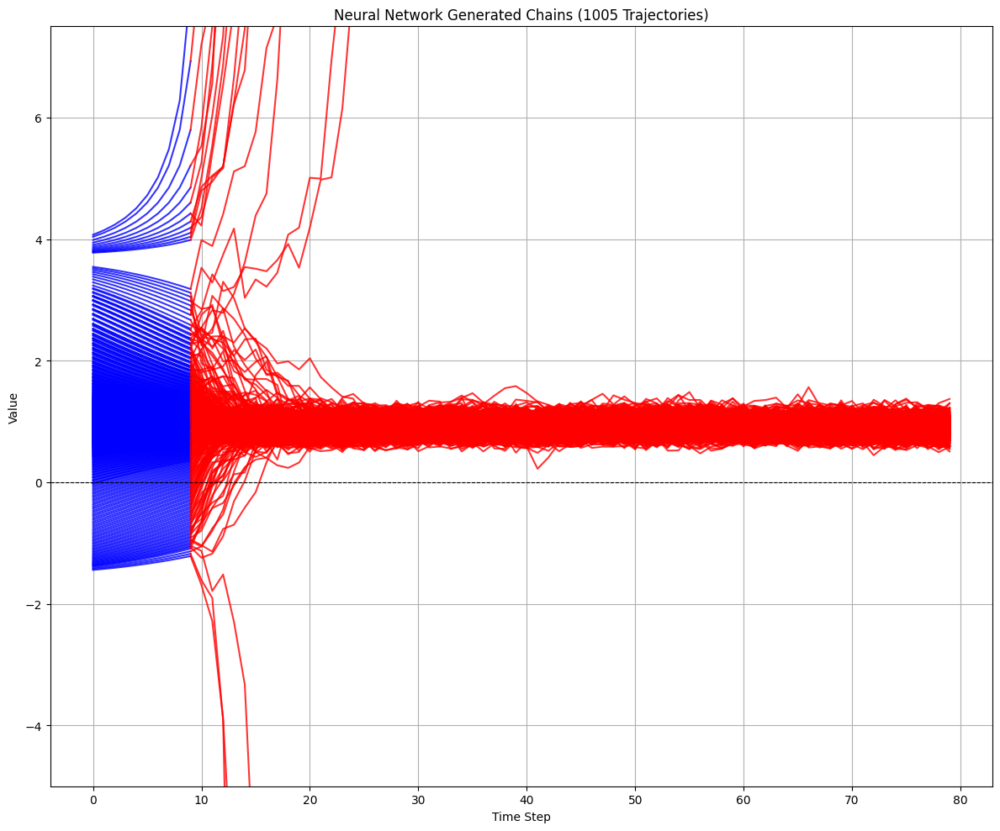

1005


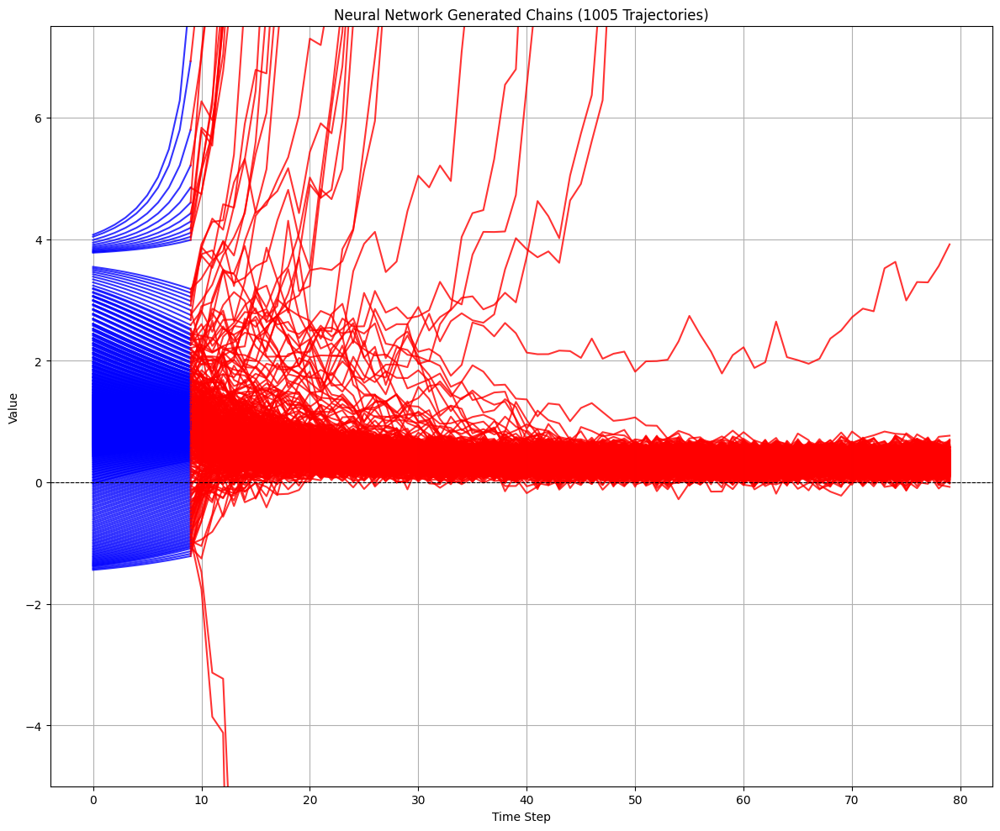

1005


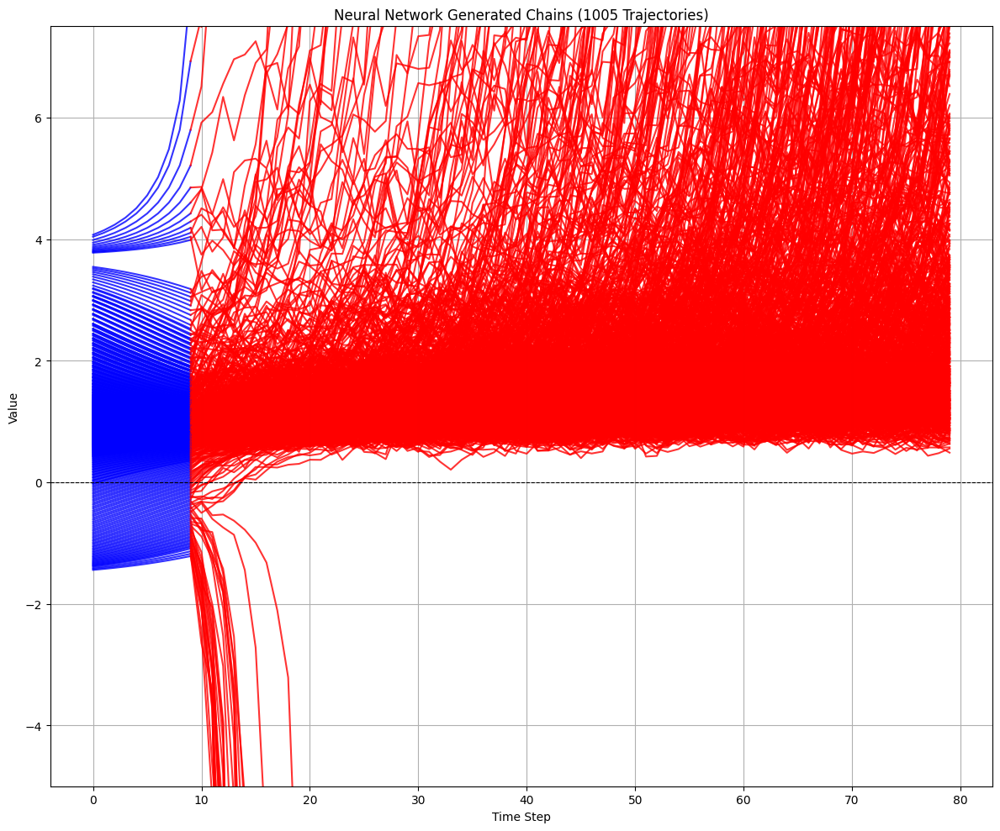

1005


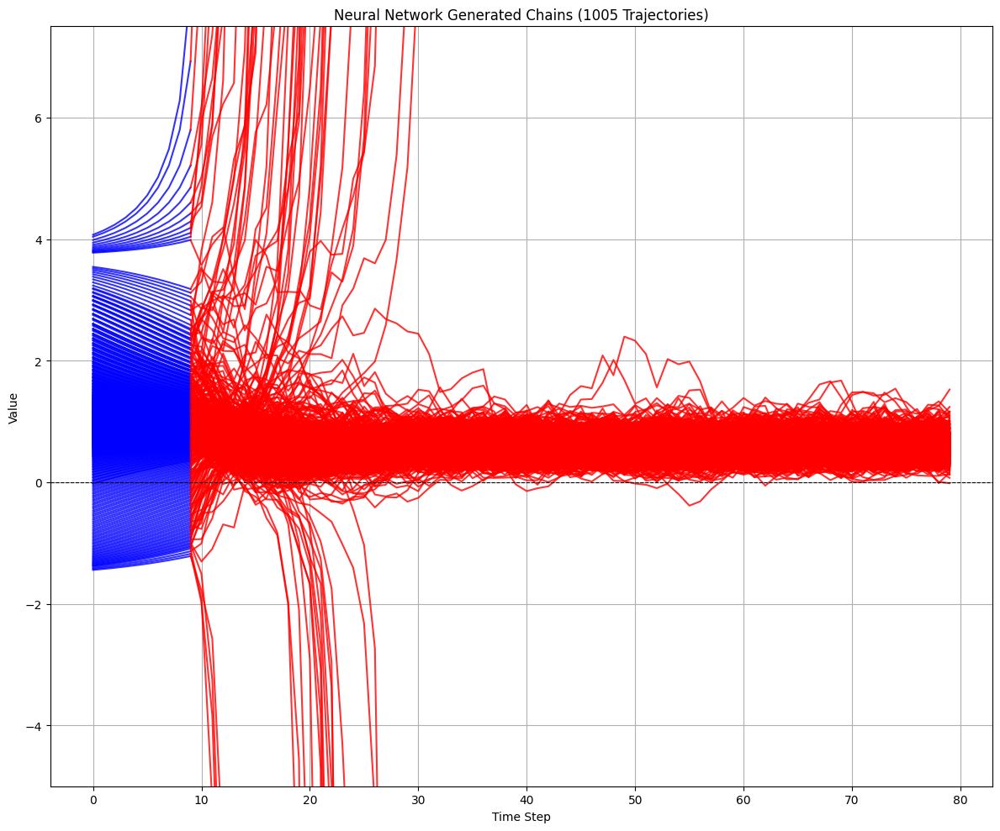

1005


KeyboardInterrupt: 

In [ ]:
for model in models:
    import matplotlib.pyplot as plt
    import numpy as np  # Missing import
    import torch
    import torch.nn.functional as F
    import math

    inputs = []
    for trajectory in all_trajectories:
        for i in range(len(trajectory) - block_size):
            inputs.append(trajectory[i:i + block_size + 1])
    training_inputs = inputs[:int(len(inputs)*.75)]
    test_inputs = inputs[int(len(inputs)*.75):]

    chains = []
    with torch.no_grad():
        print(len(test_inputs))
        for idx, test_input in enumerate(test_inputs):
            if test_input[0] > -2.5 and test_input[0] < 4.5:
                chain = test_input[:block_size].tolist()
                chains.append(chain)
                cancel = False
                i = 10
                
                while i < 80 and not cancel:  # Simplified condition
                    example_input = torch.tensor(chain[-block_size:], dtype=torch.float32).unsqueeze(0).unsqueeze(-1)
                    prediction = model(example_input, block_size)[0, -1, 0].item()
                    chain.append(prediction)  # Only append to chain
                    i += 1
                    if prediction < -5 or prediction > 7.5:
                        cancel = True

    fig, ax1 = plt.subplots(1, figsize=(12, 10))
    for chain in chains:
        t = np.arange(len(chain))
        ax1.plot(t[:block_size], chain[:block_size], color='blue', alpha=0.8)
        ax1.plot(t[block_size-1:], chain[block_size-1:], color='red', alpha=0.8)
    ax1.axhline(0, color='k', linestyle='--', linewidth=0.8)
    ax1.set_title(f"Neural Network Generated Chains ({len(chains)} Trajectories)")
    ax1.set_xlabel("Time Step")
    ax1.set_ylabel("Value")
    ax1.grid()
    ax1.set_ylim(-5, 7.5)
    plt.tight_layout()
    plt.show()

# Linearizing